<a href="https://www.kaggle.com/code/abdalrhamnhebishy/hotel-regression?scriptVersionId=189485505" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hotel-revenue2024/Hotel book.csv


In [2]:
%%HTML
<div style="text-align: center; margin-top: 20px;">
  <span style="display: inline-block; padding: 10px 20px; border-radius: 50%; background-color: #f0f0f0; box-shadow: 0 0 10px rgba(0, 0, 0, 0.2);">
    <strong style="color: #ff1a00;">---->> * If you find my Notebook useful, please Upvote me * << ----</strong>
  </span>
</div>

In [3]:
%%HTML
<html>
<head>
<style>
  body {
    font-family: Arial, sans-serif;
    background-color: #f0f0f0; /* Light background color */
    color: ##55483d; /* Text color */
  }
  .highlight {
    background-color:#7a6c58; /* Highlight color */
    padding: 2px 4px;
    border-radius: 5px;
  }
  .circle-frame {
    display: inline-block;
    background-color: #fff;
    padding: 5px;
    border-radius: 50%;
    border: 2px solid #007bff; /* Blue color for the circle frame */
  }
</style>
</head>
<body>

<h2>Simple Introduction</h2>
<ul style="list-style-type: square; margin-left: 20px;">
  <li>This dataset basically consists of revenue performance and the factors affecting it.</li>
</ul>

<h3>About Dataset:</h3>
<ul style="list-style-type: square; margin-left: 20px;">
  <li><span class="circle-frame" style="color: #007bff;">&#8594;</span> This dataset provides comprehensive insights into the operational and revenue performance of a hotel throughout the year 2024.</li>
  <li><span class="circle-frame" style="color: #007bff;">&#8600;</span> In this personal project, I will build Regression models by using <span class="highlight">LinearRegression</span>, <span class="highlight">RandomForestRegressor</span>, <span class="highlight">SVM</span>, <span class="highlight">Decision Tree Regressor</span> to implement machine learning.</li>
  <li><span class="circle-frame" style="color: #007bff;">&#8600;</span> We can use <span class="highlight">RandomForestRegressor</span> to predict with revenue performance of a hotel.</li>
</ul>

<h3>Project Parts:</h3>
<ul style="list-style-type: square; margin-left: 20px;">
  <li>Part 1: Data Analysis, Data Partition, Data Explanatory, Data Visualization</li>
  
</ul>

</body>
</html>s & Sequential Neural Network by using Tensorflow . 


In [4]:
from IPython.core.display import HTML

# Apply styles globally within the notebook
HTML('''
<style>
h2 {
    font-size: var(--jp-content-font-size4);
    background-color: #5050dc;
    color: white;
    display: flex;
    align-items: center;
    justify-content: center;
    padding: 10px 41px;
    top: 10px;
    position: relative;
    border-radius: 10px 50px 10px 50px;
}

img {
    border-radius: 150px 70px 150px 70px;
    border: 10px solid #eee;
    display: flex;
    align-items: center;
    justify-content: center;
    box-shadow: 0 0 0 transparent;
    transition: box-shadow 0.3s ease-in-out;
}

img:active {
    box-shadow: 5px 5px 10px rgba(255, 165, 0); 
}
</style>
''')

## About Dataset

* Target: Predict revenue performance.

* Features:

* Date: The date of the recorded data.

* Month: Numeric representation of the month.

* Day of the Week: Numeric representation of the day in a week.

* Season: Categorical representation of the season (e.g., Winter, Spring, Summer, Fall).

* Public Holiday: Binary indicator (0 or 1) denoting whether it's a public holiday.

* Previous Month Revenue: Revenue generated in the previous month.

* Year-over-Year Revenue: Revenue compared to the same month the previous year.

* Monthly Trend: Trend in revenue or occupancy for the month.

* Occupancy Rate: Percentage of rooms occupied.

* Average Daily Rate (ADR): Average rate charged per occupied room.

* Revenue per Available Room (RevPAR): Revenue generated per available room.

* Booking Lead Time: Average lead time between booking and stay.

* Booking Cancellations: Percentage of bookings cancelled.

* Booking Source: Source of the booking (e.g., Direct, OTA).

* Guest Type: Type of guest (e.g., Leisure, Business).

* Repeat Guests: Percentage of guests who are repeat visitors.

* Nationality: Nationality of guests.

* Group Bookings: Binary indicator denoting group bookings.

* Discounts and Promotions: Use of discounts or promotions.

* Room Rate: Average rate charged for rooms.

* Local Events: Presence of local events influencing occupancy.

* Hotel Events: Events hosted by the hotel affecting operations.

* Competitor Rates: Rates offered by competitors.

* Weather Conditions: Local weather conditions influencing guest behavior.

* Economic Indicators: Economic factors influencing hotel performance.

* Staff Levels: Staffing levels affecting service quality.

* Guest Satisfaction: Guest satisfaction ratings.

* Maintenance Issues: Issues related to maintenance affecting operations.

* Marketing Spend: Expenditure on marketing activities.

* Online Reviews: Ratings and reviews provided online.

* Social Media Engagement: Engagement metrics on social media platforms.

* Seasonal Adjustments: Adjustments made for seasonal variations.

* Trend Adjustments: Adjustments made for trending factors.

* Room Revenue: Total revenue from room bookings.

* Food and Beverage Revenue: Revenue from food and beverage services.

* Other Services Revenue: Revenue from other hotel services.

* Total Revenue for the Month: Overall revenue generated for the month.

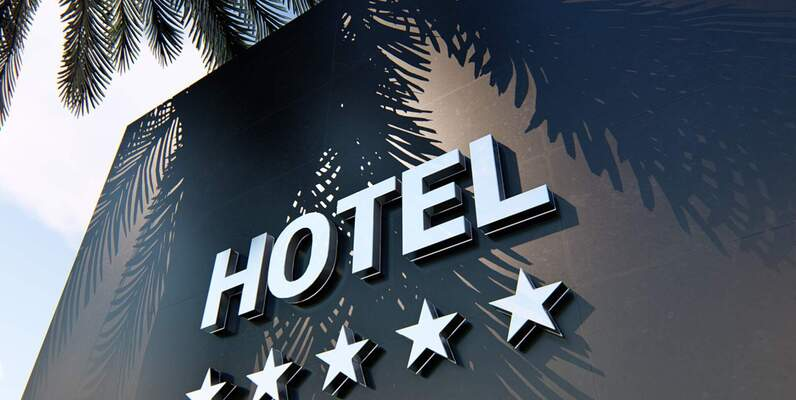

In [5]:
from io import BytesIO
from PIL import Image
import requests
from IPython.display import display

# URL of the image you want to display
url = 'https://storage.googleapis.com/kaggle-datasets-images/5360416/8914054/28e97bf2fda6475f9461c9bac409a042/dataset-cover.jpg?t=2024-07-09-12-02-57'

# Fetch the image data from the URL
response = requests.get(url)
img = Image.open(BytesIO(response.content))

# Display the image
display(img)

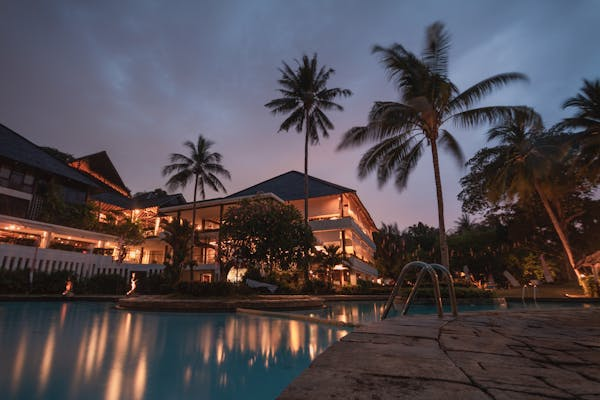

In [6]:
from io import BytesIO
from PIL import Image
import requests
from IPython.display import display

# URL of the image you want to display
url = 'https://images.pexels.com/photos/258154/pexels-photo-258154.jpeg?auto=compress&cs=tinysrgb&w=600'

# Fetch the image data from the URL
response = requests.get(url)
img = Image.open(BytesIO(response.content))

# Display the image
display(img)

In [7]:
!pip install pywaffle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.6/25.6 MB 57.9 MB/s eta 0:00:00


In [8]:
!pip install Waffle

  Preparing metadata (setup.py) ... - done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.1 MB/s eta 0:00:00
  Created wheel for Waffle: filename=waffle-0.5.0-py3-none-any.whl size=16513 sha256=82a257c8ba7033f740d3a5941cd60239c1713c7c4fca9b6f778cd22e06bd1dde
  Stored in directory: /root/.cache/pip/wheels/49/81/51/88aedf28aaf857bf03efcb70a30fbcf2140032ace1f83e3514
Successfully built Waffle


Part 1: Data Analysis, Data Partition, Data Explanatory, Data Visualization

In [9]:
# imports :
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import IPython.display
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator , TransformerMixin
from sklearn.feature_selection import VarianceThreshold ,f_classif ,SelectKBest
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import classification_report,confusion_matrix ,ConfusionMatrixDisplay
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from pywaffle import Waffle 

## Analysis Dataset :

In [10]:
#load the dataset:

data=pd.read_csv("/kaggle/input/hotel-revenue2024/Hotel book.csv")
data.head(10)

,Date,Month,Weekday,Season,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,ADR,...,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs,Profit
0,01/01/2024,1,1,Winter,1,50000,80000,45000,0.75,120,...,75,4.5,0.75,45000,50000,10000,5000,65000,15000,NaN
1,02/01/2024,1,2,Winter,0,60000,85000,48000,0.78,125,...,78,4.6,0.78,48000,55000,12000,6000,73000,12000,NaN
2,03/01/2024,1,3,Winter,0,70000,90000,49000,0.80,130,...,80,4.7,0.80,49000,58000,11000,7000,76000,14000,NaN
3,04/01/2024,1,4,Winter,1,50000,80000,45000,0.75,120,...,75,4.5,0.75,45000,50000,10000,5000,65000,15000,NaN
4,05/01/2024,1,5,Winter,0,60000,85000,48000,0.78,125,...,78,4.6,0.78,48000,55000,12000,6000,73000,12000,NaN
5,06/01/2024,1,6,Winter,0,70000,90000,49000,0.80,130,...,80,4.7,0.80,49000,58000,11000,7000,76000,14000,NaN
6,07/01/2024,1,7,Winter,0,50000,80000,45000,0.75,120,...,75,4.5,0.75,45000,50000,10000,5000,65000,15000,NaN
7,08/01/2024,1,1,Winter,0,60000,85000,48000,0.78,125,...,78,4.6,0.78,48000,55000,12000,6000,73000,12000,NaN
8,09/01/2024,1,2,Winter,0,70000,90000,49000,0.80,130,...,80,4.7,0.80,49000,58000,11000,7000,76000,14000,NaN
9,10/01/2024,1,3,Winter,0,50000,80000,45000,0.75,120,...,75,4.5,0.75,45000,50000,10000,5000,65000,15000,NaN


In [11]:
# get information about the data:

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109 entries, 0 to 108
Data columns (total 38 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      109 non-null    object 
 1   Month                     109 non-null    int64  
 2   Weekday                   109 non-null    int64  
 3   Season                    109 non-null    object 
 4   Holiday                   109 non-null    int64  
 5   Marketing_Spend           109 non-null    int64  
 6   Revenue                   109 non-null    int64  
 7   Room_Revenue              109 non-null    int64  
 8   Occupancy_Rate            109 non-null    float64
 9   ADR                       109 non-null    int64  
 10  RevPAR                    109 non-null    float64
 11  Available_Rooms           109 non-null    int64  
 12  Reserved_Rooms            109 non-null    int64  
 13  Booking_Channel           109 non-null    object 
 14  Guest_Type

In [12]:
#get the statistical:

data.describe().T

,count,mean,std,min,25%,50%,75%,max
Month,109.0,3.266055,2.406173,1.00,1.00,2.00,7.00,7.00
Weekday,109.0,3.908257,2.030058,1.00,2.00,4.00,6.00,7.00
Holiday,109.0,0.119266,0.325598,0.00,0.00,0.00,0.00,1.00
Marketing_Spend,109.0,59954.128440,8093.647853,50000.00,50000.00,60000.00,70000.00,70000.00
Revenue,109.0,84917.431193,4501.292901,78000.00,80000.00,85000.00,90000.00,93000.00
Room_Revenue,109.0,47009.174312,2057.035861,43000.00,45000.00,48000.00,49000.00,50000.00
Occupancy_Rate,109.0,0.774862,0.023516,0.73,0.75,0.78,0.80,0.81
ADR,109.0,124.743119,5.191524,115.00,120.00,125.00,130.00,135.00
RevPAR,109.0,95.289083,7.906691,79.15,90.00,96.00,101.12,108.54
Available_Rooms,109.0,31.376147,1.451621,28.00,30.00,32.00,33.00,33.00


In [13]:
# check if there a null values: Profit  

data.isna().mean()

Date                        0.0
Month                       0.0
Weekday                     0.0
Season                      0.0
Holiday                     0.0
Marketing_Spend             0.0
Revenue                     0.0
Room_Revenue                0.0
Occupancy_Rate              0.0
ADR                         0.0
RevPAR                      0.0
Available_Rooms             0.0
Reserved_Rooms              0.0
Booking_Channel             0.0
Guest_Type                  0.0
Market_Segment              0.0
Guest_Country               0.0
Complaints                  0.0
Compliment                  0.0
Bookings                    0.0
No_Shows                    0.0
Cancellations               0.0
Checkouts                   0.0
New_Bookings                0.0
Checkins                    0.0
Average_Review_Score        0.0
Revenue_Managed_Guests      0.0
RevPAR_Managed_Guests       0.0
Occupancy_Managed_Guests    0.0
RevPAR_All                  0.0
Occupancy_All               0.0
Room_Rev

In [14]:
# SHAPE of data :

print(np.shape(data))

(109, 38)


## Data Explantory : (using pandas )

In [15]:
# Extract all Types of columns from the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns
    num_cols=data.select_dtypes("number").columns
    disc_cols=data.select_dtypes(include=("int64")).columns
    conts_cols=data.select_dtypes(include=("float64")).columns
    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index(['Date', 'Season', 'Booking_Channel', 'Guest_Type', 'Guest_Country'], dtype='object')
 Numerical_columns ----->>> Index(['Month', 'Weekday', 'Holiday', 'Marketing_Spend', 'Revenue',
       'Room_Revenue', 'Occupancy_Rate', 'ADR', 'RevPAR', 'Available_Rooms',
       'Reserved_Rooms', 'Market_Segment', 'Complaints', 'Compliment',
       'Bookings', 'No_Shows', 'Cancellations', 'Checkouts', 'New_Bookings',
       'Checkins', 'Average_Review_Score', 'Revenue_Managed_Guests',
       'RevPAR_Managed_Guests', 'Occupancy_Managed_Guests', 'RevPAR_All',
       'Occupancy_All', 'Room_Revenue_All', 'Total_Revenue',
       'Operating_Expenses', 'Fixed_Costs', 'Variable_Costs', 'Total_Costs',
       'Profit'],
      dtype='object') 
 Discrete_columns ---->>> Index(['Month', 'Weekday', 'Holiday', 'Marketing_Spend', 'Revenue',
       'Room_Revenue', 'ADR', 'Available_Rooms', 'Reserved_Rooms',
       'Complaints', 'Compliment', 'Bookings', 'No_Shows', 'Cancellations',
    

In [16]:
for col in data.columns:
    print(f"All items in the ---->>>{col} column  :  \n{data[col].unique()}")
    print("*"*50)

All items in the ---->>>Date column  :  
['01/01/2024' '02/01/2024' '03/01/2024' '04/01/2024' '05/01/2024'
 '06/01/2024' '07/01/2024' '08/01/2024' '09/01/2024' '10/01/2024'
 '11/01/2024' '12/01/2024' '13/01/2024' '14/01/2024' '15/01/2024'
 '16/01/2024' '17/01/2024' '18/01/2024' '19/01/2024' '20/01/2024'
 '21/01/2024' '22/01/2024' '23/01/2024' '24/01/2024' '25/01/2024'
 '26/01/2024' '27/01/2024' '28/01/2024' '29/01/2024' '30/01/2024'
 '31/01/2024' '01/02/2024' '02/02/2024' '03/02/2024' '04/02/2024'
 '05/02/2024' '06/02/2024' '07/02/2024' '08/02/2024' '09/02/2024'
 '10/02/2024' '11/02/2024' '12/02/2024' '13/02/2024' '14/02/2024'
 '15/02/2024' '16/02/2024' '17/02/2024' '18/02/2024' '19/02/2024'
 '20/02/2024' '21/02/2024' '22/02/2024' '23/02/2024' '24/02/2024'
 '25/02/2024' '26/02/2024' '27/02/2024' '28/02/2024' '29/02/2024'
 '01/03/2024' '02/03/2024' '03/03/2024' '04/03/2024' '05/03/2024'
 '06/03/2024' '07/03/2024' '08/03/2024' '09/03/2024' '10/03/2024'
 '11/03/2024' '12/03/2024' '13/03/2

In [17]:
for col in data.columns:
    print(data[col].value_counts())
    print("*"*50)

Date
01/01/2024    1
10/03/2024    1
03/07/2024    1
02/07/2024    1
19/03/2024    1
             ..
03/02/2024    1
02/02/2024    1
01/02/2024    1
31/01/2024    1
31/07/2024    1
Name: count, Length: 109, dtype: int64
**************************************************
Month
1    31
7    30
2    29
3    19
Name: count, dtype: int64
**************************************************
Weekday
1    17
2    17
3    15
4    15
5    15
6    15
7    15
Name: count, dtype: int64
**************************************************
Season
Winter    60
Summer    30
Spring    19
Name: count, dtype: int64
**************************************************
Holiday
0    96
1    13
Name: count, dtype: int64
**************************************************
Marketing_Spend
50000    32
70000    32
60000    18
55000    14
65000    13
Name: count, dtype: int64
**************************************************
Revenue
80000    25
85000    16
90000    16
91000    14
82000     8
88000     8
78000     6
8100

In [18]:
# Here the column  id is useless for that i will drop it :
# cleaning the data :
data=data.drop(columns=["Profit"],axis=1)
data

,Date,Month,Weekday,Season,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,ADR,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
0,01/01/2024,1,1,Winter,1,50000,80000,45000,0.75,120,...,4.5,75,4.5,0.75,45000,50000,10000,5000,65000,15000
1,02/01/2024,1,2,Winter,0,60000,85000,48000,0.78,125,...,4.6,78,4.6,0.78,48000,55000,12000,6000,73000,12000
2,03/01/2024,1,3,Winter,0,70000,90000,49000,0.80,130,...,4.7,80,4.7,0.80,49000,58000,11000,7000,76000,14000
3,04/01/2024,1,4,Winter,1,50000,80000,45000,0.75,120,...,4.5,75,4.5,0.75,45000,50000,10000,5000,65000,15000
4,05/01/2024,1,5,Winter,0,60000,85000,48000,0.78,125,...,4.6,78,4.6,0.78,48000,55000,12000,6000,73000,12000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,27/07/2024,7,5,Summer,0,50000,78000,43000,0.73,115,...,4.3,73,4.3,0.73,43000,48000,10000,4000,58000,20000
105,28/07/2024,7,6,Summer,0,55000,81000,44000,0.75,120,...,4.4,75,4.4,0.75,44000,50000,10500,4500,59500,21500
106,29/07/2024,7,7,Summer,0,65000,87000,46000,0.78,125,...,4.5,78,4.5,0.78,46000,52000,11000,5000,67000,20000
107,30/07/2024,7,1,Summer,0,70000,91000,48000,0.80,130,...,4.7,80,4.7,0.80,48000,55000,11000,6000,71000,20000


## Data Explantory with sql :

In [19]:
import sqlite3

conn = sqlite3.connect('Hotel.db')

# Create a cursor object
cursor = conn.cursor()

#create table and show it :

data.to_sql("hotel1",conn)

df2=pd.read_sql("SELECT * FROM HOTEL1",conn)
df2

,index,Date,Month,Weekday,Season,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
0,0,01/01/2024,1,1,Winter,1,50000,80000,45000,0.75,...,4.5,75,4.5,0.75,45000,50000,10000,5000,65000,15000
1,1,02/01/2024,1,2,Winter,0,60000,85000,48000,0.78,...,4.6,78,4.6,0.78,48000,55000,12000,6000,73000,12000
2,2,03/01/2024,1,3,Winter,0,70000,90000,49000,0.80,...,4.7,80,4.7,0.80,49000,58000,11000,7000,76000,14000
3,3,04/01/2024,1,4,Winter,1,50000,80000,45000,0.75,...,4.5,75,4.5,0.75,45000,50000,10000,5000,65000,15000
4,4,05/01/2024,1,5,Winter,0,60000,85000,48000,0.78,...,4.6,78,4.6,0.78,48000,55000,12000,6000,73000,12000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,104,27/07/2024,7,5,Summer,0,50000,78000,43000,0.73,...,4.3,73,4.3,0.73,43000,48000,10000,4000,58000,20000
105,105,28/07/2024,7,6,Summer,0,55000,81000,44000,0.75,...,4.4,75,4.4,0.75,44000,50000,10500,4500,59500,21500
106,106,29/07/2024,7,7,Summer,0,65000,87000,46000,0.78,...,4.5,78,4.5,0.78,46000,52000,11000,5000,67000,20000
107,107,30/07/2024,7,1,Summer,0,70000,91000,48000,0.80,...,4.7,80,4.7,0.80,48000,55000,11000,6000,71000,20000


In [20]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109 entries, 0 to 108
Data columns (total 38 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   index                     109 non-null    int64  
 1   Date                      109 non-null    object 
 2   Month                     109 non-null    int64  
 3   Weekday                   109 non-null    int64  
 4   Season                    109 non-null    object 
 5   Holiday                   109 non-null    int64  
 6   Marketing_Spend           109 non-null    int64  
 7   Revenue                   109 non-null    int64  
 8   Room_Revenue              109 non-null    int64  
 9   Occupancy_Rate            109 non-null    float64
 10  ADR                       109 non-null    int64  
 11  RevPAR                    109 non-null    float64
 12  Available_Rooms           109 non-null    int64  
 13  Reserved_Rooms            109 non-null    int64  
 14  Booking_Ch

In [21]:
df2.describe(include="number").T

,count,mean,std,min,25%,50%,75%,max
index,109.0,54.000000,31.609598,0.00,27.00,54.00,81.00,108.00
Month,109.0,3.266055,2.406173,1.00,1.00,2.00,7.00,7.00
Weekday,109.0,3.908257,2.030058,1.00,2.00,4.00,6.00,7.00
Holiday,109.0,0.119266,0.325598,0.00,0.00,0.00,0.00,1.00
Marketing_Spend,109.0,59954.128440,8093.647853,50000.00,50000.00,60000.00,70000.00,70000.00
Revenue,109.0,84917.431193,4501.292901,78000.00,80000.00,85000.00,90000.00,93000.00
Room_Revenue,109.0,47009.174312,2057.035861,43000.00,45000.00,48000.00,49000.00,50000.00
Occupancy_Rate,109.0,0.774862,0.023516,0.73,0.75,0.78,0.80,0.81
ADR,109.0,124.743119,5.191524,115.00,120.00,125.00,130.00,135.00
RevPAR,109.0,95.289083,7.906691,79.15,90.00,96.00,101.12,108.54


In [22]:
# check null_values :
df2.isna().sum()

index                       0
Date                        0
Month                       0
Weekday                     0
Season                      0
Holiday                     0
Marketing_Spend             0
Revenue                     0
Room_Revenue                0
Occupancy_Rate              0
ADR                         0
RevPAR                      0
Available_Rooms             0
Reserved_Rooms              0
Booking_Channel             0
Guest_Type                  0
Market_Segment              0
Guest_Country               0
Complaints                  0
Compliment                  0
Bookings                    0
No_Shows                    0
Cancellations               0
Checkouts                   0
New_Bookings                0
Checkins                    0
Average_Review_Score        0
Revenue_Managed_Guests      0
RevPAR_Managed_Guests       0
Occupancy_Managed_Guests    0
RevPAR_All                  0
Occupancy_All               0
Room_Revenue_All            0
Total_Reve

In [23]:
df2.head(5)

,index,Date,Month,Weekday,Season,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
0,0,01/01/2024,1,1,Winter,1,50000,80000,45000,0.75,...,4.5,75,4.5,0.75,45000,50000,10000,5000,65000,15000
1,1,02/01/2024,1,2,Winter,0,60000,85000,48000,0.78,...,4.6,78,4.6,0.78,48000,55000,12000,6000,73000,12000
2,2,03/01/2024,1,3,Winter,0,70000,90000,49000,0.80,...,4.7,80,4.7,0.80,49000,58000,11000,7000,76000,14000
3,3,04/01/2024,1,4,Winter,1,50000,80000,45000,0.75,...,4.5,75,4.5,0.75,45000,50000,10000,5000,65000,15000
4,4,05/01/2024,1,5,Winter,0,60000,85000,48000,0.78,...,4.6,78,4.6,0.78,48000,55000,12000,6000,73000,12000


## Data Explantory and Data Analysis by using sql :

In [24]:
# Q1:see in which season the Room_Revenue is max IN WINTER SEASON  :

print("The maxiumum number of Room_Revenue in Winter Seasons :")
R1=cursor.execute("SELECT SEASON, MAX(BOOKINGS) FROM HOTEL1 WHERE SEASON='Winter'")
R1.fetchall()


The maxiumum number of Room_Revenue in Winter Seasons :


[('Winter', 10)]

In [25]:
# Q2:to see count pepole WHOTAKE Holiday in season winter:

print("the Number of pepole who take Holidays in winter season :")
R2=cursor.execute("SELECT SEASON, COUNT(HOLIDAY) FROM HOTEL1 WHERE SEASON='Winter' AND HOLIDAY='1'")
R2.fetchall()

the Number of pepole who take Holidays in winter season :


[('Winter', 9)]

In [26]:
# Q3 : At any season Marketing_Spend has the heighest value :

print("in any season the marketing_spand is the higher:")
R3=cursor.execute("SELECT SEASON, MAX(MARKETING_SPEND) FROM HOTEL1 ")
R3.fetchall()


in any season the marketing_spand is the higher:


[('Winter', 70000)]

In [27]:
# Q4 : to see in any weekday , month ,season the Occupancy_Rate become max :Month Weekday

print("IN winter , month_2 ,6_weeken_day AND 0.81_Occupancy_Rate")
R4=cursor.execute("SELECT SEASON, MONTH,WEEKDAY,MAX(OCCUPANCY_RATE) FROM HOTEL1 ")
R4.fetchall()


IN winter , month_2 ,6_weeken_day AND 0.81_Occupancy_Rate


[('Winter', 2, 6, 0.81)]

In [28]:
# Q5:Number OF PEPOLE THAT take holiday in month_1 
print("Number of pepole that take holiday in month_1 :")
R5=cursor.execute("SELECT MONTH, COUNT(HOLIDAY) FROM HOTEL1 WHERE HOLIDAY='1'AND MONTH='1' ")
R5.fetchall() 


Number of pepole that take holiday in month_1 :


[(1, 5)]

In [29]:
# Q6: sum of Revenue:
print("sum of Revenue in month 2 :")
R6=cursor.execute("SELECT SUM(Revenue),MONTH FROM HOTEL1 WHERE MONTH='2' ")
R6.fetchall()


sum of Revenue in month 2 :


[(2469000, 2)]

In [30]:
# Q7:TO KNOW NUMBEr RevPAR_Managed_Guests that bigger 4.5:

print("Number of REVPAR_MANAGED_GUESTS that >4.5 :")
R7=cursor.execute("SELECT COUNT(REVPAR_MANAGED_GUESTS)  FROM HOTEL1 WHERE REVPAR_MANAGED_GUESTS>4.5")
R7.fetchall()

Number of REVPAR_MANAGED_GUESTS that >4.5 :


[(58,)]

In [31]:
# finally close :
cursor.close()
conn.close()

## Visualization the Dataset 

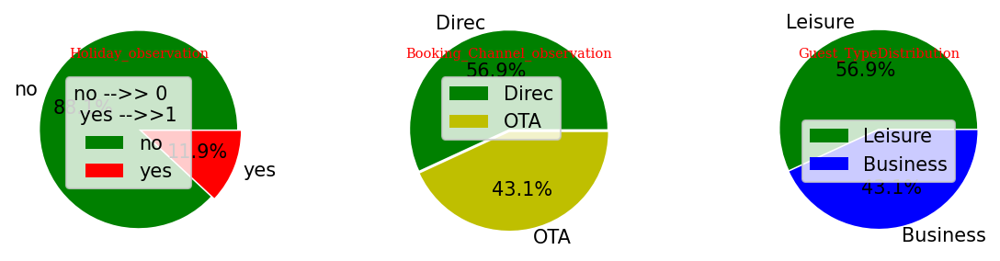

<Figure size 640x480 with 0 Axes>

In [32]:
# Font style for titles
f1 = {"family": "serif", "size": 7, "color": "r"}


# Create a figure with a specified size and DPI
plt.figure(figsize=(15, 15), dpi=150)

# Plot 1
Holiday = data["Holiday"].value_counts()
plt.subplot(5, 5, 1)  # Create the first subplot
plt.title("Holiday_observation", fontdict=f1)
plt.pie(
    x=Holiday,                                                   
    labels=["no", "yes"],
    colors=["g","r"],
    explode=[0.01, 0.07],
    autopct='%1.1f%%',
    radius=2,
)                                                                     

plt.legend(title="no -->> 0 \n yes -->>1 ")


# Plot 2

Booking_Channel = data["Booking_Channel"].value_counts()
plt.subplot(5, 5, 2)  # Create the second subplot
plt.title("Booking_Channel_observation", fontdict=f1)
plt.pie(
    x=Booking_Channel,
    labels=["Direc", "OTA"],
    colors=["g","y"],
    explode=[0.01, 0.05],
    autopct='%1.1f%%',
    radius=2,
)
plt.legend()
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=2,hspace=1)


#plot3:

# to observe how many of the Guest_Type :

plt.subplot(5,5,3)
Guest_Type=data["Guest_Type"].value_counts()
plt.pie(x=Guest_Type,labels=["Leisure","Business"],colors=["g","b"],explode=[0.02,0.01],autopct='%1.1f%%',radius=2)  
plt.title("Guest_TypeDistribution",fontdict=f1)
plt.legend()
plt.show()

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=2,hspace=1)

plt.show()

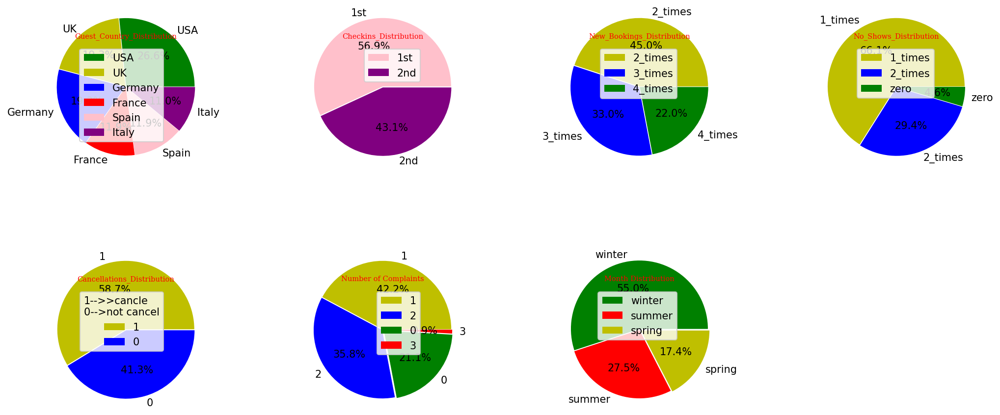

In [33]:
#font properties :
f={"family":"serif","size":7,"color":"r"}

# Create a figure with a specified size and DPI
plt.figure(figsize=(15, 15), dpi=150)

# plot4:Guest_Country

# to observe how many have the Guest_Country:
plt.subplot(4, 4, 1)  # Create the first subplot
plt.title("Guest_Country_Distribution",fontdict=f1)
explicit=data["Guest_Country"].value_counts()
plt.pie(x=explicit,labels=["USA","UK","Germany","France","Spain","Italy"]
        ,colors=["g","y","b","r","pink","purple"]
        ,explode=[0.01,0.02,0.02,0.01,0.01,0.02],autopct='%1.1f%%',radius=2)
plt.legend()


# plot5:Checkins

# to observe how many have the Checkins

plt.subplot(4,4,2)
plt.title("Checkins_Distribution",fontdict=f)
Checkins=data["Checkins"].value_counts()
plt.pie(x=Checkins,labels=["1st","2nd"]
        ,colors=["pink","purple"]
        ,explode=[0.01,0.02],autopct='%1.1f%%',radius=2)
plt.legend()

# Adjust the spacing between subplots:
plt.subplots_adjust(wspace=2,hspace=1)



# plot6:New_Bookings

# to observe how many have the New_Bookings

plt.subplot(4,4,3)
plt.title("New_Bookings_Distribution",fontdict=f)
Checkins=data["New_Bookings"].value_counts()
plt.pie(x=Checkins,colors=["y","b","g"]
        ,labels=["2_times","3_times","4_times"]
        ,explode=[0.01,0.02,0.01],autopct='%1.1f%%',radius=2)
plt.legend()

# Adjust the spacing between subplots:
plt.subplots_adjust(wspace=2,hspace=1)

# plot7:No_Shows 

# to observe how many have the New_Bookings

plt.subplot(4,4,4)
plt.title("No_Shows_Distribution",fontdict=f)
No_Shows=data["No_Shows"].value_counts()
plt.pie(x=No_Shows,colors=["y","b","g"]
        ,labels=["1_times","2_times","zero"]
        ,explode=[0.01,0.02,0.01],autopct='%1.1f%%',radius=2)
plt.legend()

# Adjust the spacing between subplots:
plt.subplots_adjust(wspace=2,hspace=1)


#plot8 :Cancellations

plt.subplot(4,4,5)
plt.title("Cancellations_Distribution",fontdict=f)
Cancellations=data["Cancellations"].value_counts()
plt.pie(x=Cancellations,colors=["y","b"]
        ,labels=["1","0"]
        ,explode=[0.01,0.02],autopct='%1.1f%%',radius=2)
plt.legend(title=("1-->>cancle\n0-->not cancel" ))

# Adjust the spacing between subplots:
plt.subplots_adjust(wspace=2,hspace=1)

#plot9 :Complaints

plt.subplot(4,4,6)
plt.title("Number of Complaints",fontdict=f)
Complaints=data["Complaints"].value_counts()
plt.pie(x=Complaints,colors=["y","b","g","r"]
        ,labels=["1","2","0","3"]
        ,explode=[0.01,0.02,0.05,0.03],autopct='%1.1f%%',radius=2)
plt.legend()

# Adjust the spacing between subplots:
plt.subplots_adjust(wspace=2,hspace=1)


#plot_10:
# observe the the Season distribution : 

plt.subplot(4,4,7)
plt.title("Month Distribution",fontdict=f)
month=data["Season"].value_counts()
plt.pie(x=month,
        explode=[0.02,0.01,0.05],
        labels=["winter","summer","spring"]
        ,colors=["g","r","y"],
        autopct='%1.1f%%',
        radius=2)
plt.legend()
plt.show()


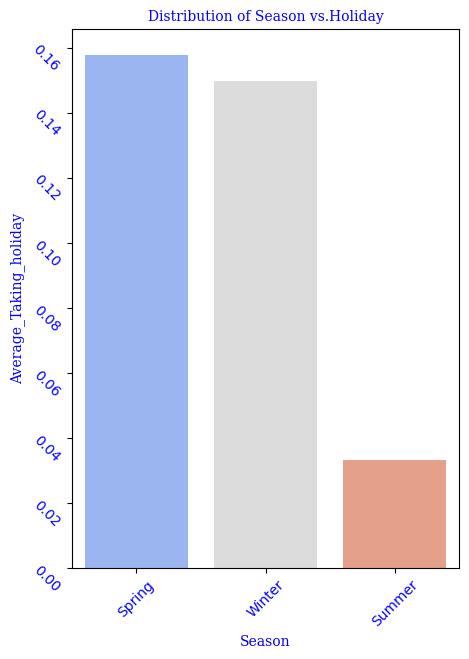

In [34]:
# oserve the Season vs.Holiday:
# to know the most season the pepole love to take holiday in it:

f2={"family":"serif","size":10,"color":"b"}
plt.figure(figsize=(5,7))
plt.title("Distribution of Season vs.Holiday",fontdict=f2)
top_10_popularity=data.groupby("Season")["Holiday"].mean().sort_values(ascending=False).head(10)
sns.barplot(x=top_10_popularity.index,y=top_10_popularity.values,color="r",label="popularity",palette='coolwarm')
plt.xticks(rotation=45,color="b")
plt.xlabel("Season",fontdict=f2)
plt.ylabel("Average_Taking_holiday",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


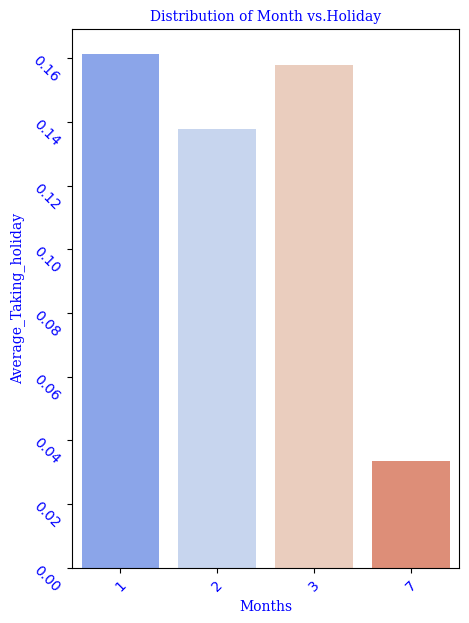

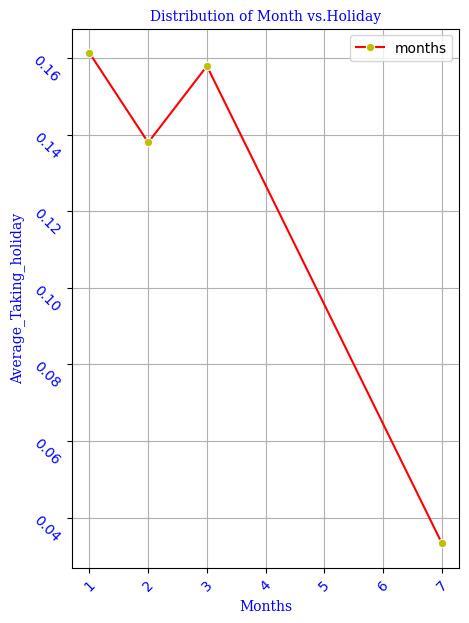

In [35]:
# oserve the Season vs.Holiday:

# to know the most Month the pepole love to take holiday in it:

f2={"family":"serif","size":10,"color":"b"}


#barplot:

plt.figure(figsize=(5,7))

plt.title("Distribution of Month vs.Holiday",fontdict=f2)
top=data.groupby("Month")["Holiday"].mean().sort_values(ascending=False).head(10)

sns.barplot(x=top.index,y=top.values,color="r",label="popularity",palette='coolwarm')

plt.xticks(rotation=45,color="b")
plt.xlabel("Months",fontdict=f2)
plt.ylabel("Average_Taking_holiday",fontdict=f2)
plt.yticks(rotation=-45,color="b")


# line plot :
plt.figure(figsize=(5,7))
plt.title("Distribution of Month vs.Holiday",fontdict=f2)

sns.lineplot(x=top.index,y=top.values,color="r",label="months",marker="o",mfc="y")

plt.xticks(rotation=45,color="b")
plt.xlabel("Months",fontdict=f2)
plt.ylabel("Average_Taking_holiday",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


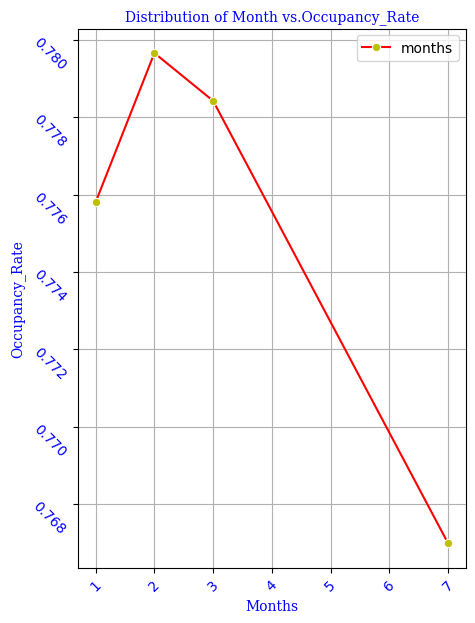

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


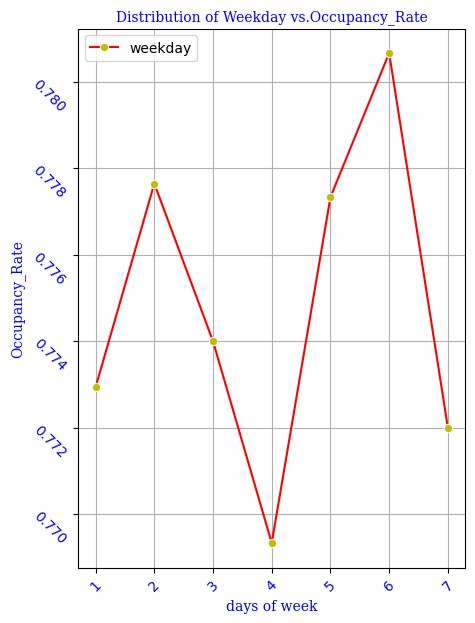

In [36]:
# we will see at any  the Month ,Weekday Occupancy_Rate become higher : 

# line plot of month with Occupancy_Rate :
plt.figure(figsize=(5,7))
plt.title("Distribution of Month vs.Occupancy_Rate",fontdict=f2)

top1=data.groupby("Month")["Occupancy_Rate"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",label="months",marker="o",mfc="y")

plt.xticks(rotation=45,color="b")
plt.xlabel("Months",fontdict=f2)
plt.ylabel("Occupancy_Rate",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()

#line plot of Weekday with Occupancy_Rate :


plt.figure(figsize=(5,7))
plt.title("Distribution of Weekday vs.Occupancy_Rate",fontdict=f2)

top1=data.groupby("Weekday")["Occupancy_Rate"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",marker="o",mfc="y",label="weekday")

plt.xticks(rotation=45,color="b")
plt.xlabel("days of week",fontdict=f2)
plt.ylabel("Occupancy_Rate",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()


array([[<Axes: title={'center': 'Month'}>,
        <Axes: title={'center': 'Weekday'}>,
        <Axes: title={'center': 'Holiday'}>,
        <Axes: title={'center': 'Marketing_Spend'}>,
        <Axes: title={'center': 'Revenue'}>,
        <Axes: title={'center': 'Room_Revenue'}>],
       [<Axes: title={'center': 'Occupancy_Rate'}>,
        <Axes: title={'center': 'ADR'}>,
        <Axes: title={'center': 'RevPAR'}>,
        <Axes: title={'center': 'Available_Rooms'}>,
        <Axes: title={'center': 'Reserved_Rooms'}>,
        <Axes: title={'center': 'Market_Segment'}>],
       [<Axes: title={'center': 'Complaints'}>,
        <Axes: title={'center': 'Compliment'}>,
        <Axes: title={'center': 'Bookings'}>,
        <Axes: title={'center': 'No_Shows'}>,
        <Axes: title={'center': 'Cancellations'}>,
        <Axes: title={'center': 'Checkouts'}>],
       [<Axes: title={'center': 'New_Bookings'}>,
        <Axes: title={'center': 'Checkins'}>,
        <Axes: title={'center': 'Average

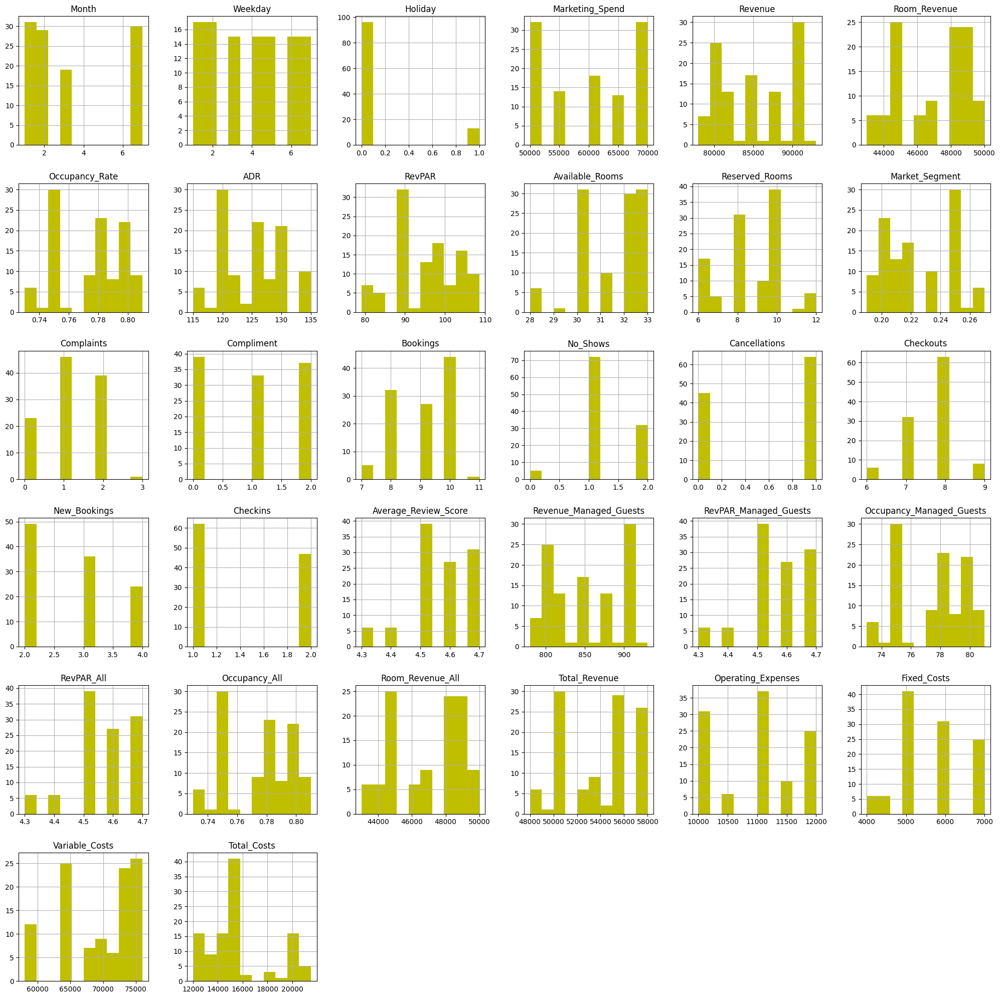

In [37]:
# plot the histgram:
data.hist(figsize=(25,25),color="y")

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

<Figure size 30000x30000 with 0 Axes>

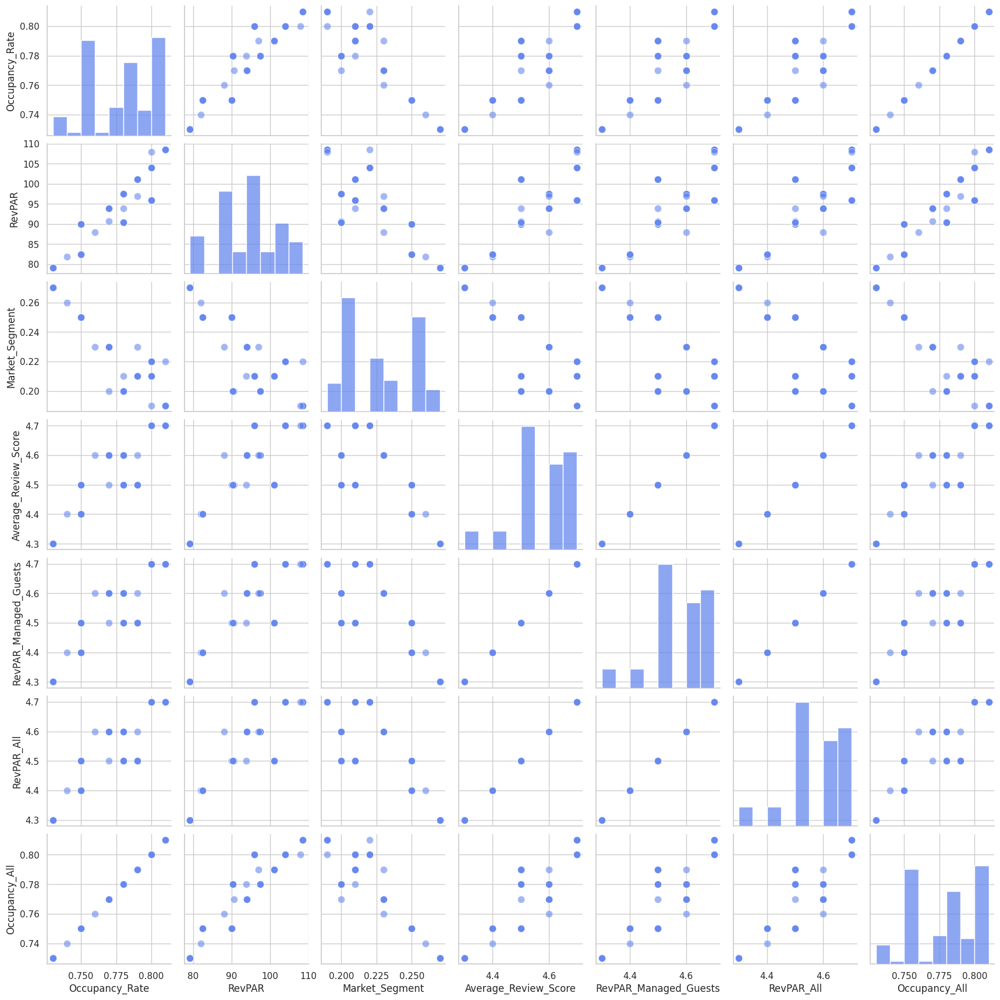

In [38]:
# observe for the float_data
plt.figure(figsize=(100, 100), dpi=300)
sns.set(style="whitegrid")  # Set the plot style
sns.set_palette("coolwarm")    # Set the color palette
sns.pairplot(data.select_dtypes(include='float64'), plot_kws={'alpha': 0.6, 's': 80})

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

<Figure size 30000x30000 with 0 Axes>

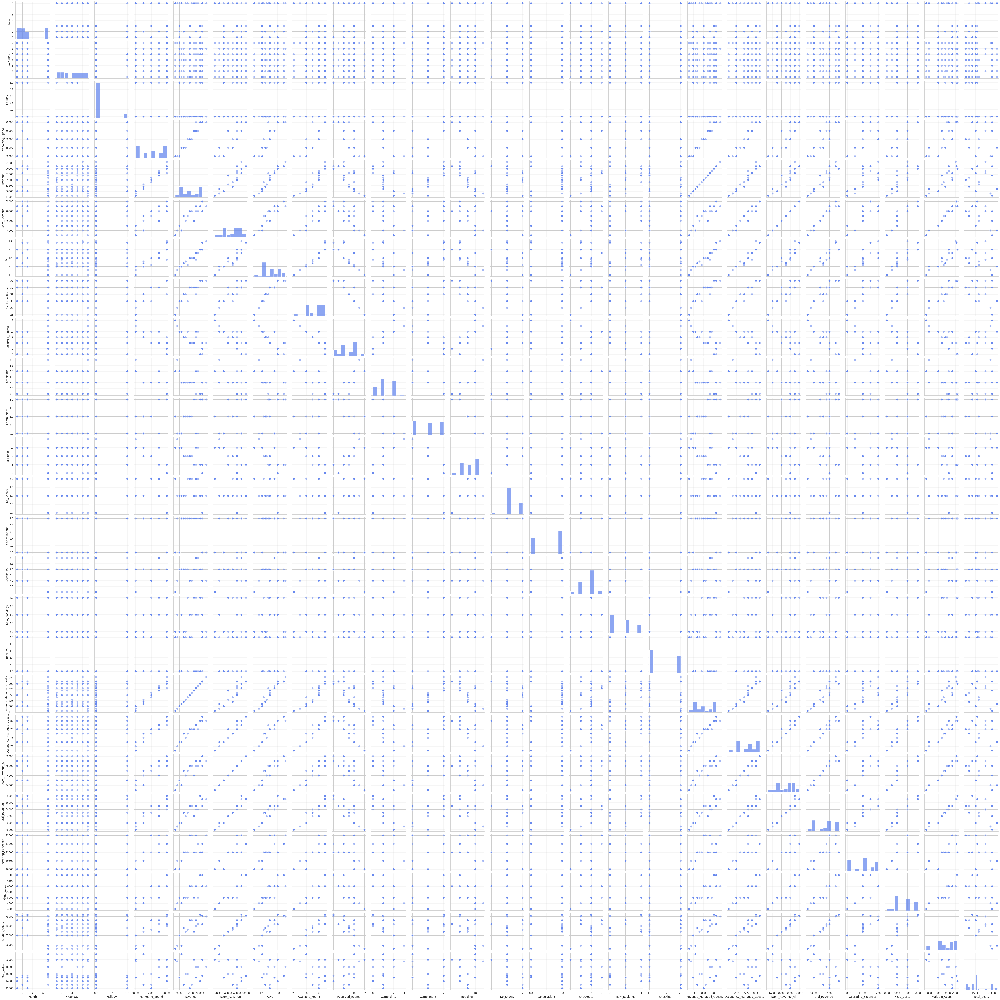

In [39]:
# observe for the integear_data :
plt.figure(figsize=(100, 100), dpi=300)
sns.set(style="whitegrid")     # Set the plot style
sns.set_palette("coolwarm")    # Set the color palette
sns.pairplot(data.select_dtypes(include='int64'), plot_kws={'alpha': 0.6, 's': 80})

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

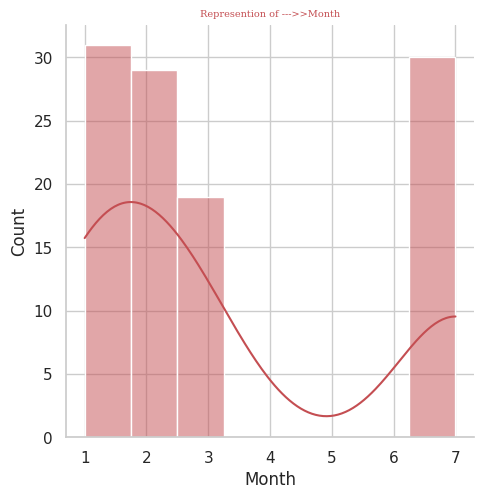

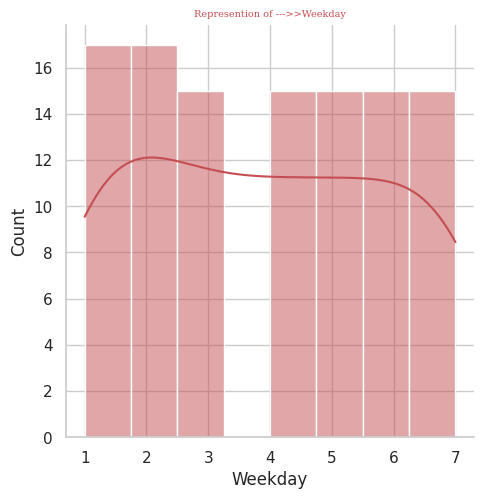

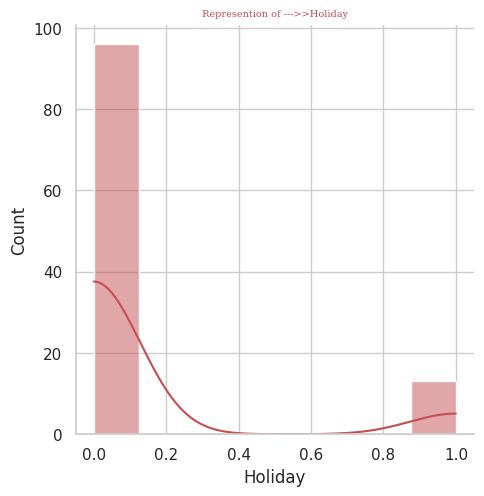

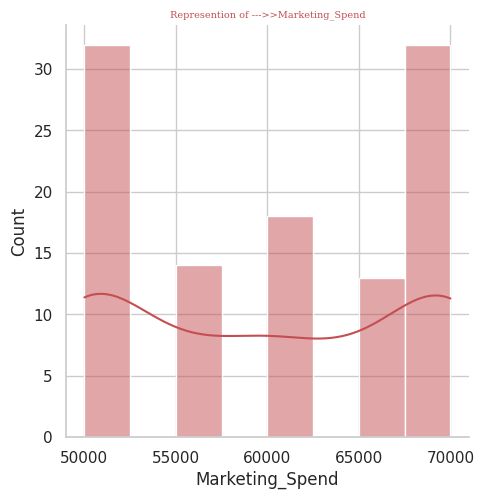

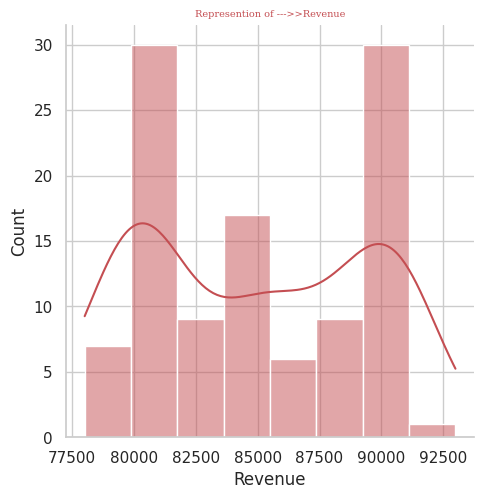

...

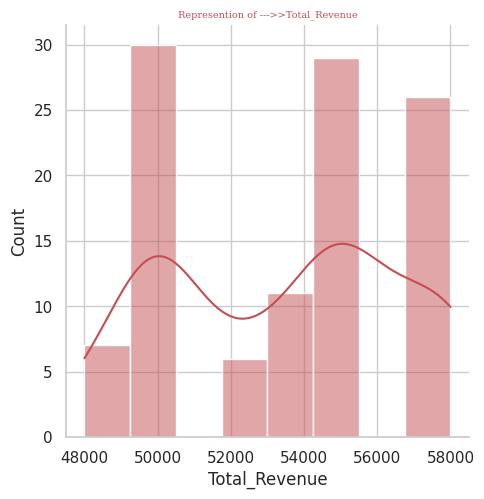

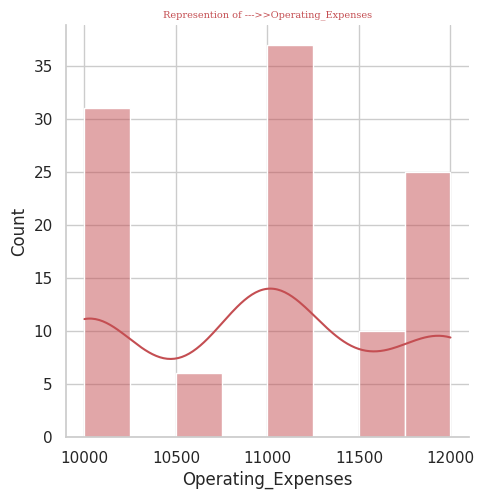

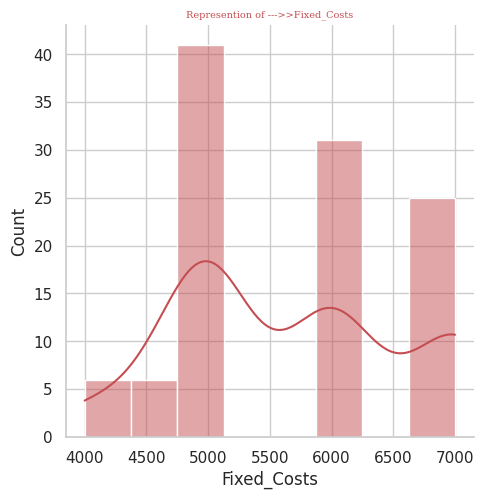

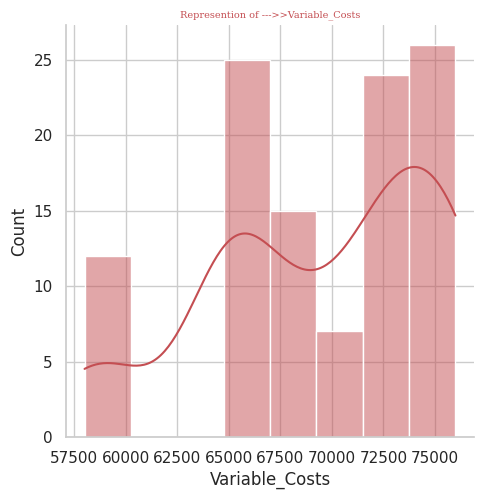

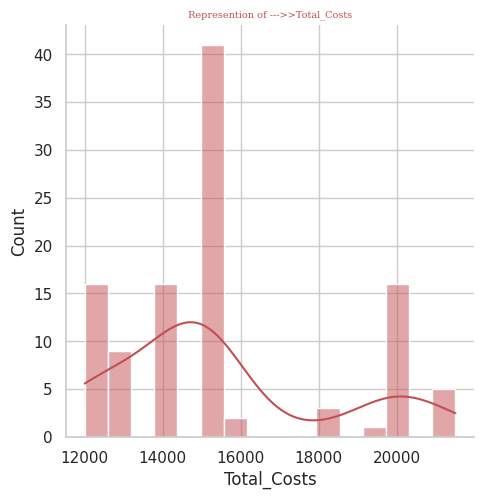

In [40]:
for col in data.select_dtypes(include="int64").columns:
    sns.displot(data[col],kde=True,color="r",label=col)
    sns.set(style="whitegrid")      # Set the plot style
    sns.set_palette("coolwarm")    # Set the color palette
    plt.title("Represention of --->>"+col,fontdict=f)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


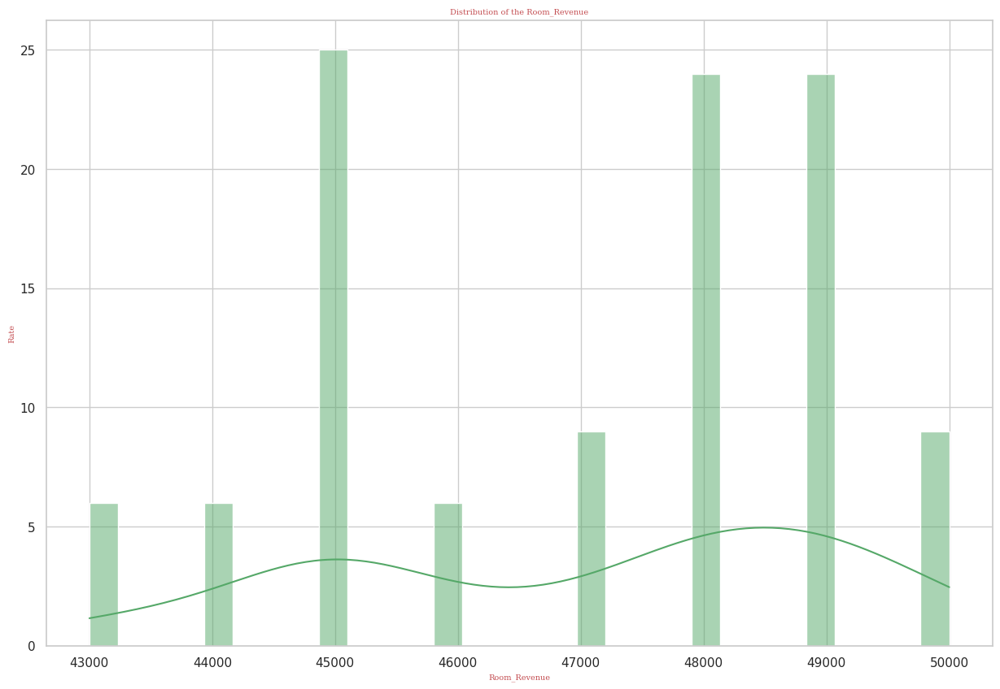

In [41]:
#observe the popularity distribution:
plt.figure(figsize=(15,10))
plt.title("Distribution of the Room_Revenue",fontdict=f)
plt.xlabel("Room_Revenue",fontdict=f)
plt.ylabel("Rate",fontdict=f)
sns.histplot(data["Room_Revenue"],color="g",bins=30,kde=True,label="Room_Revenue")
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

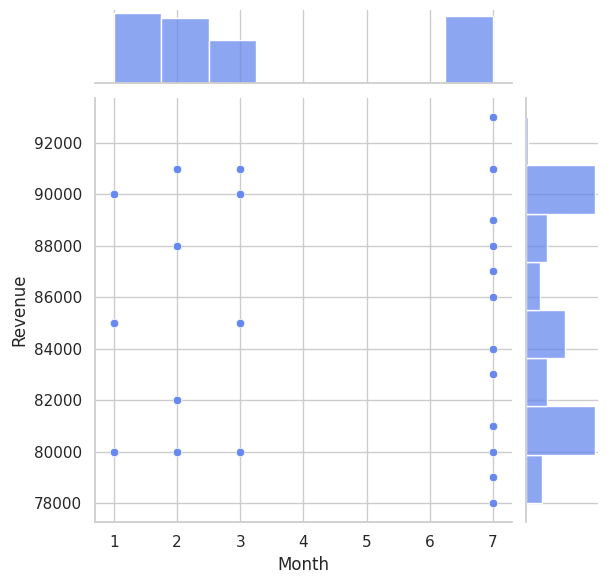

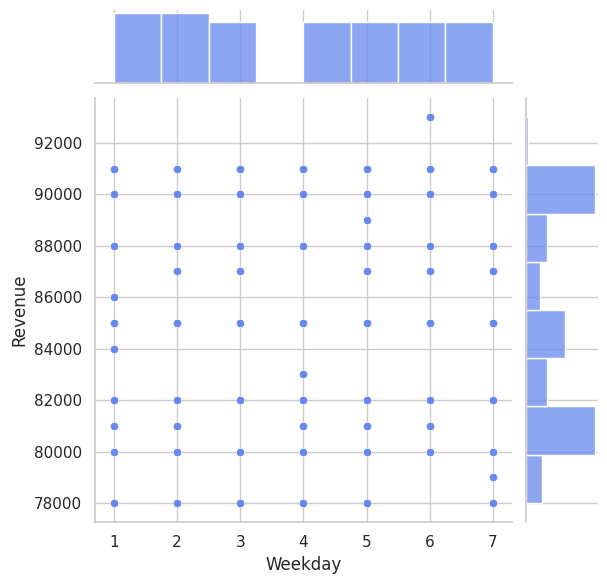

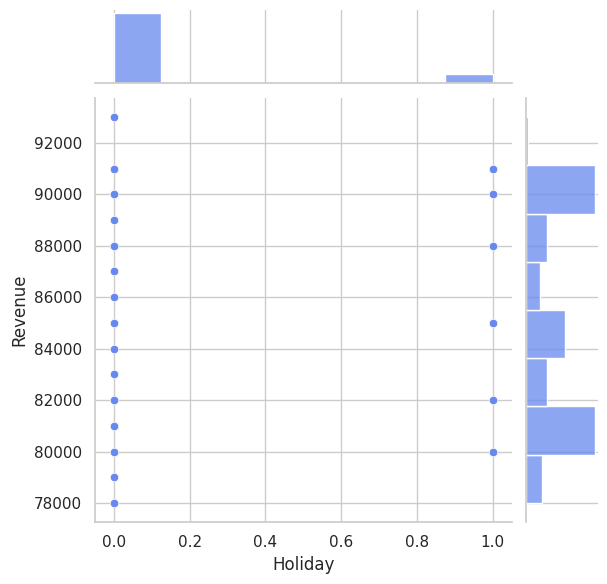

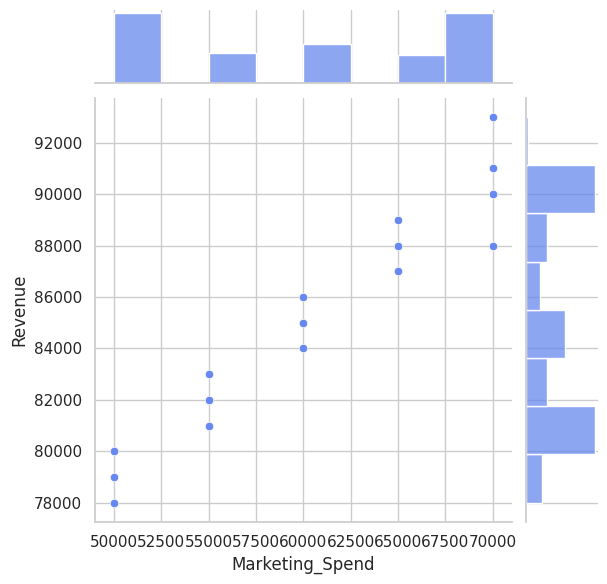

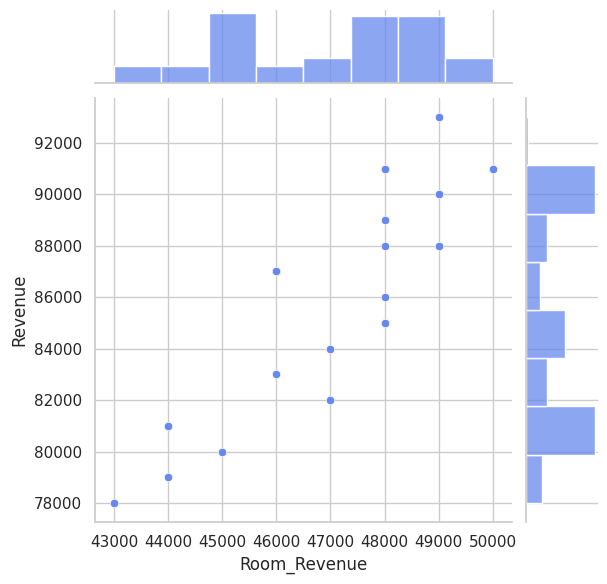

...

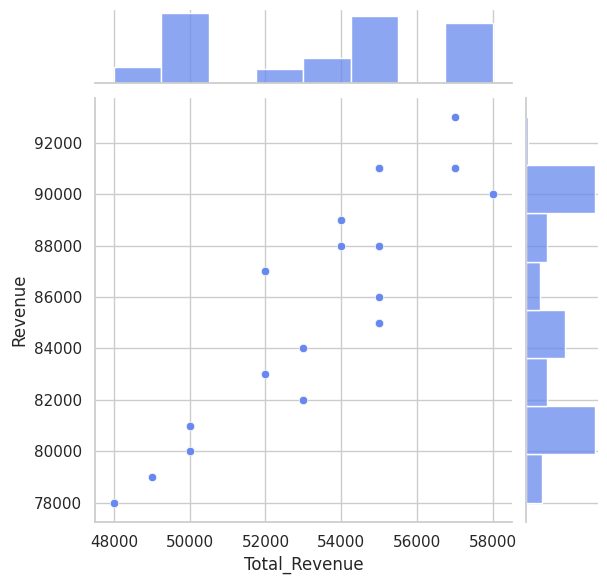

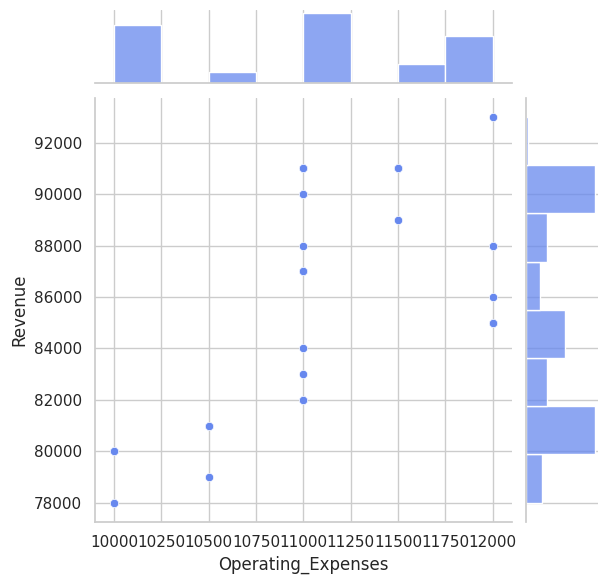

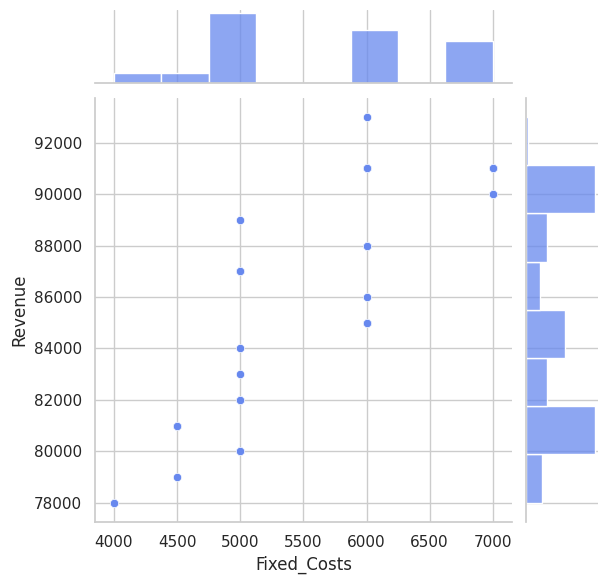

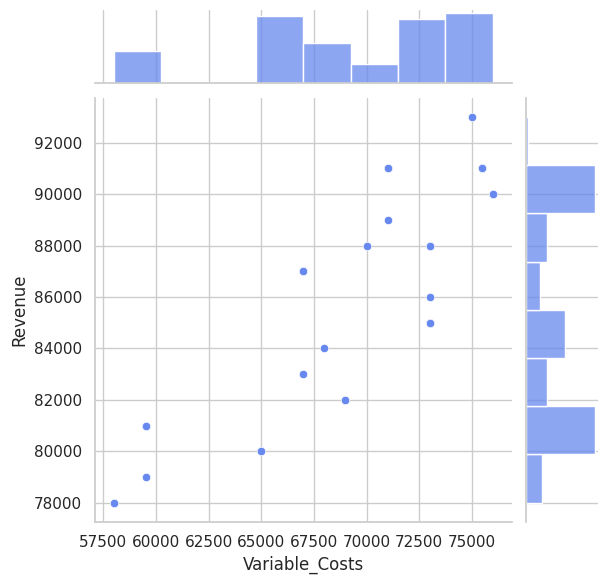

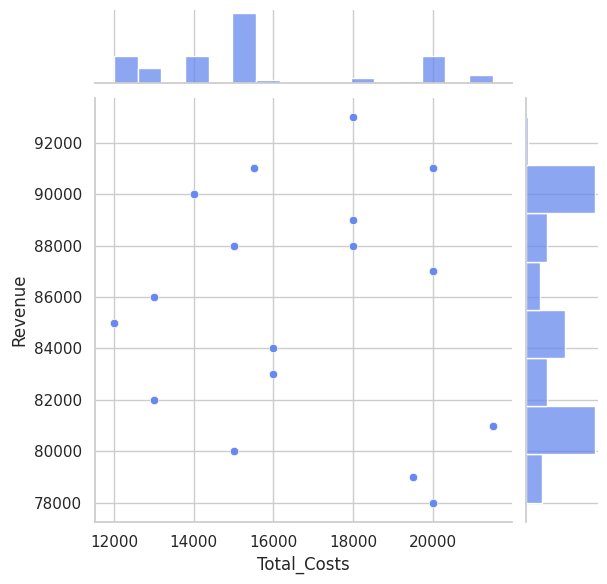

In [42]:
for col in data.select_dtypes("number"):
    if col !="Revenue":
       with sns.axes_style("white"):
          sns.set(style="whitegrid")  # Set the plot style
          sns.set_palette("coolwarm")    # Set the color palette
          sns.jointplot(x=data[col],y=data["Revenue"],kind="scatter")
           

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


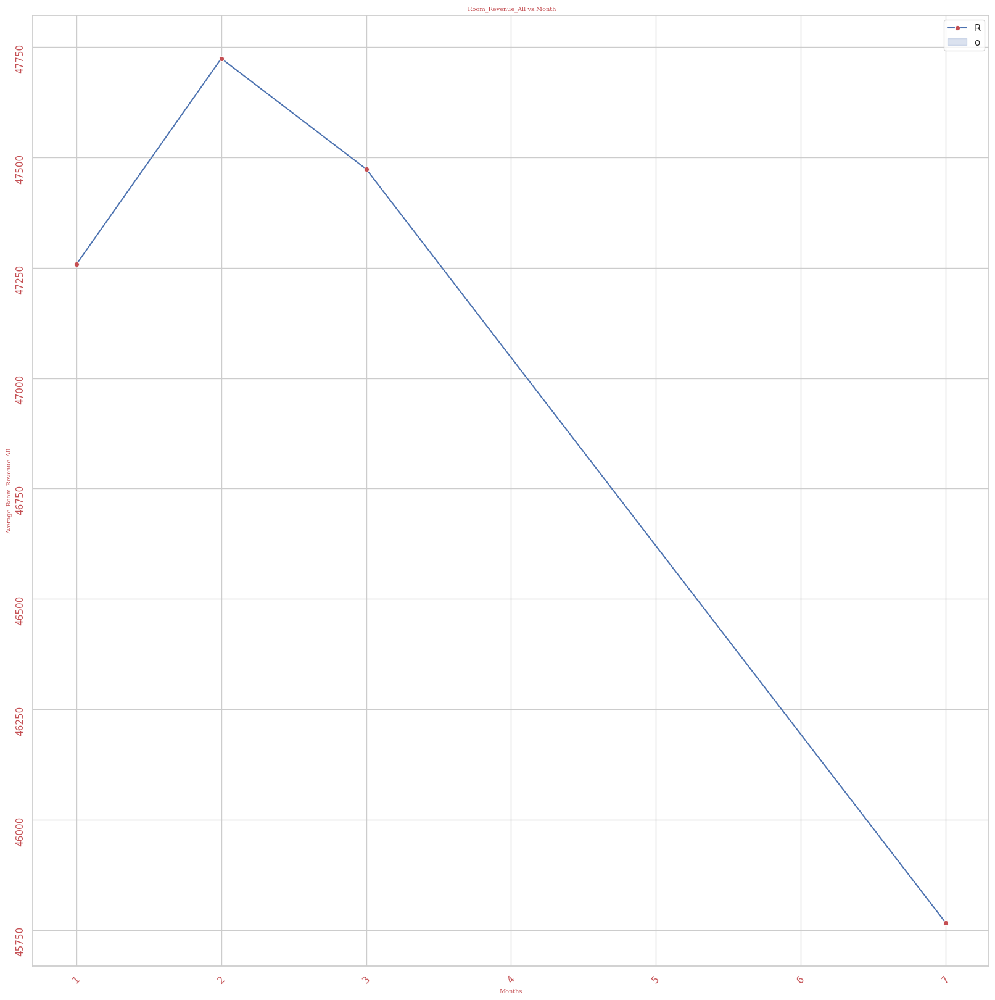

In [43]:
#trend of Room_Revenue_All vs.Month:

plt.figure(figsize=(20, 20))
Room_Revenue_All=data.groupby("Month")["Room_Revenue_All"].mean().sort_values(ascending=False)
sns.lineplot(x=Room_Revenue_All.index,y=Room_Revenue_All.values,marker='o', linestyle='-', color='b',mfc="r")


plt.xlabel('Months',fontdict=f1)
plt.ylabel('Average_Room_Revenue_All',fontdict=f1)
plt.title(' Room_Revenue_All vs.Month',fontdict=f1)
plt.xticks(rotation=45,color="r")
plt.yticks(rotation=90,color="r")
plt.legend("Room_Revenue_All" )
plt.grid(True)
plt.show()

## Feature Engeneering:

In [44]:
df = data.loc[:, 'Room_Revenue_All':'Total_Costs']
df.head()

,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
0,45000,50000,10000,5000,65000,15000
1,48000,55000,12000,6000,73000,12000
2,49000,58000,11000,7000,76000,14000
3,45000,50000,10000,5000,65000,15000
4,48000,55000,12000,6000,73000,12000


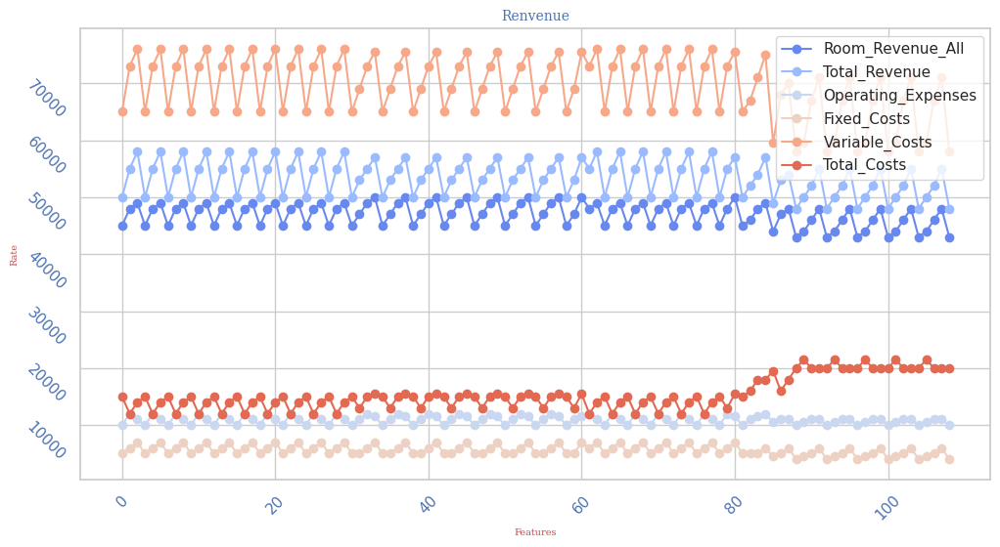

In [45]:
plt.figure(figsize=(12, 6))

for col in df.columns:
    plt.plot( df[col], marker='o', linestyle='-', label=col)

plt.xlabel('Features',fontdict=f)
plt.ylabel('Rate',fontdict=f)
plt.title("Renvenue",fontdict=f2)
plt.legend()
plt.grid(True)
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.show()

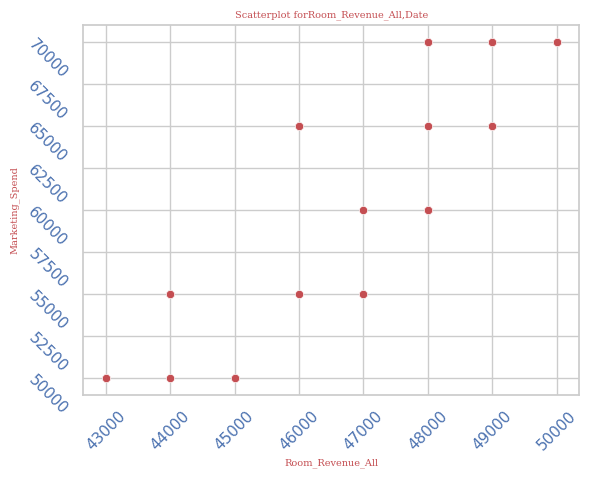

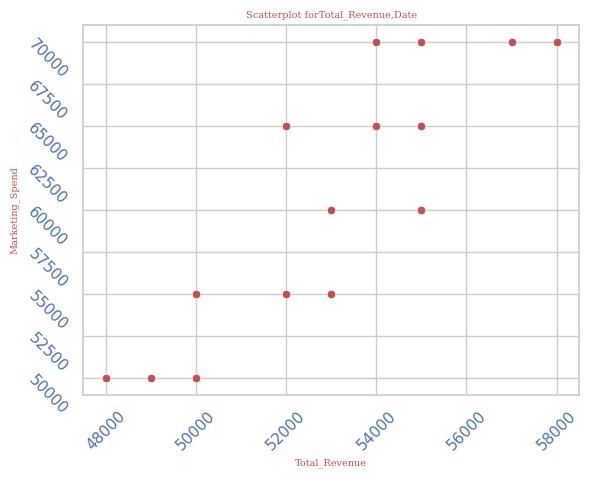

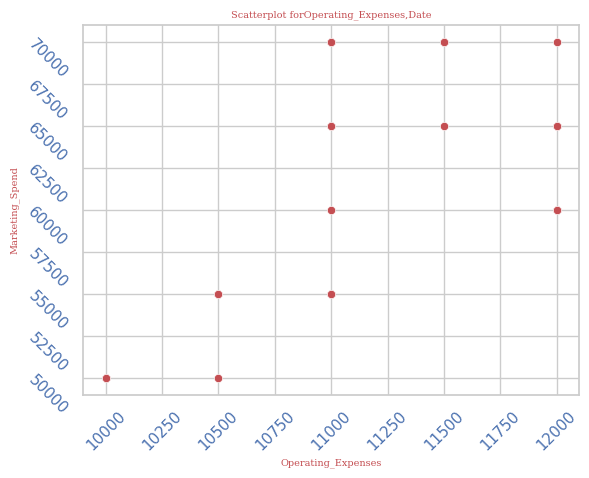

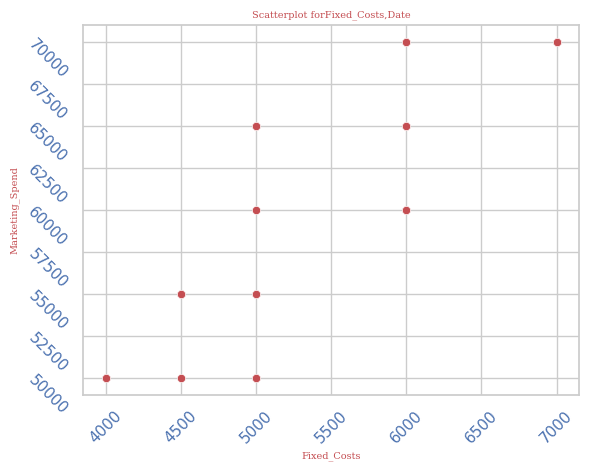

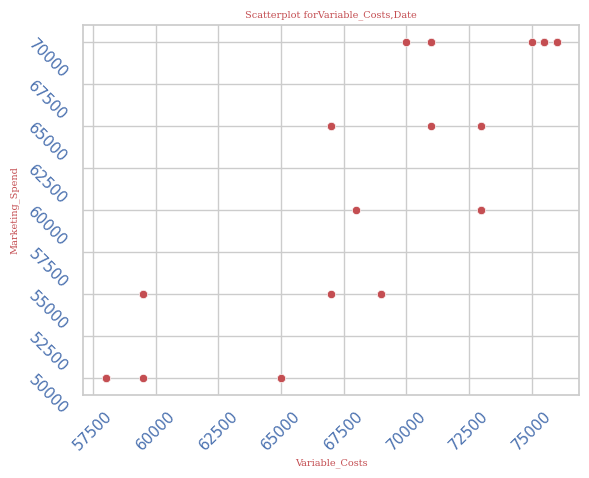

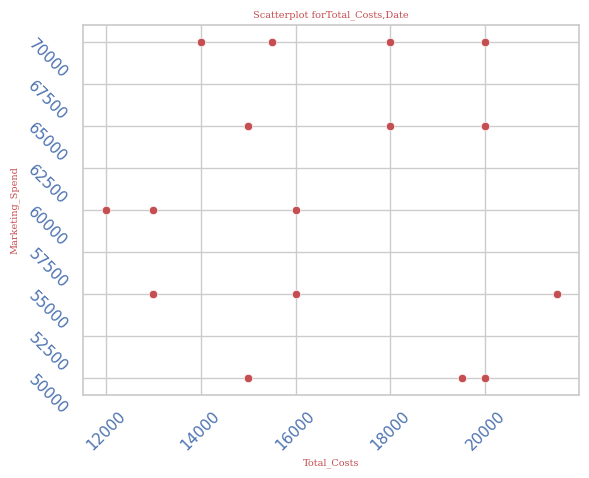

In [46]:
# to see relation between 
for col in df.columns :
     sns.scatterplot(x=df[col],y=data["Marketing_Spend"],color="r")
     plt.title("Scatterplot for" +col+ ",Date",fontdict=f)
     plt.xticks(rotation=45,color="b")
     plt.yticks(rotation=-45,color="b")
     plt.xlabel(col,fontdict=f)
     plt.ylabel("Marketing_Spend",fontdict=f)
     sns.set_style("whitegrid")      
     plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

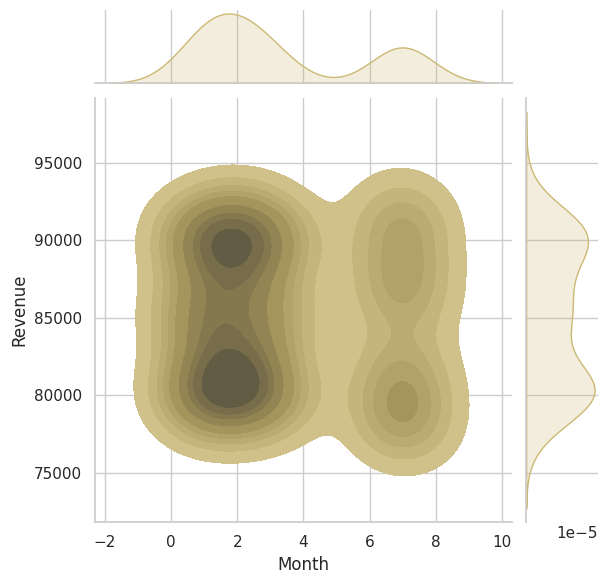

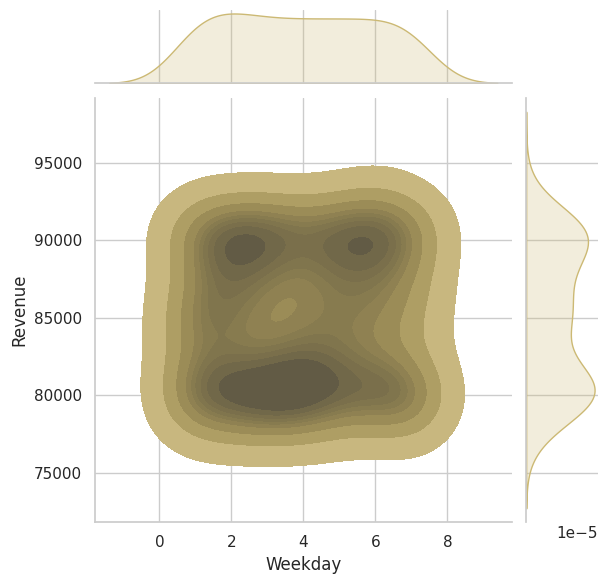

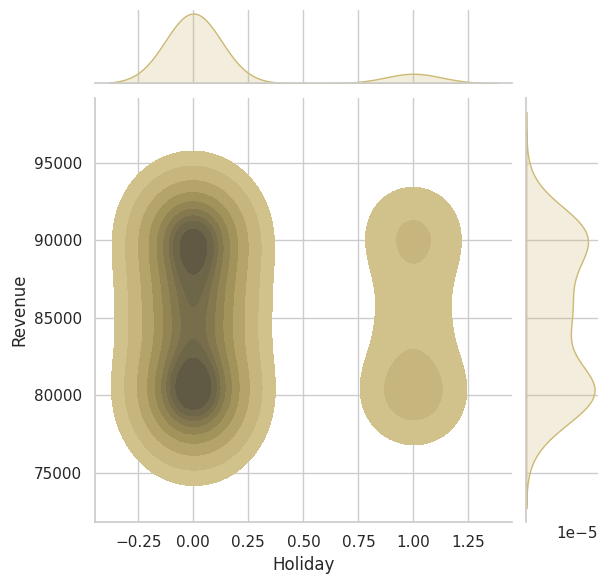

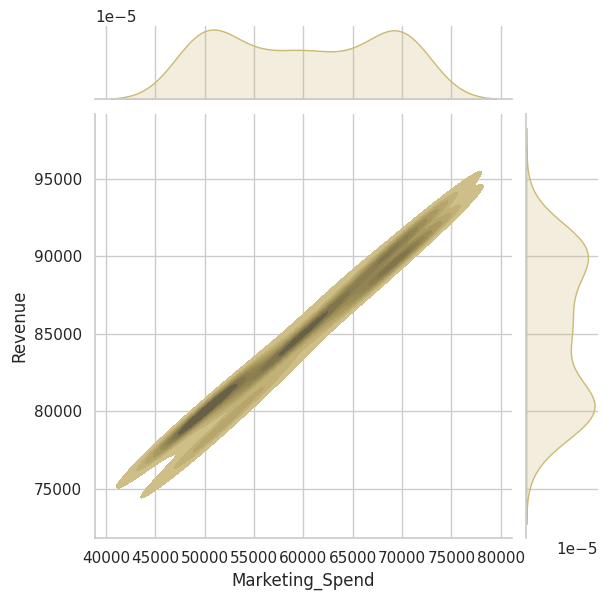

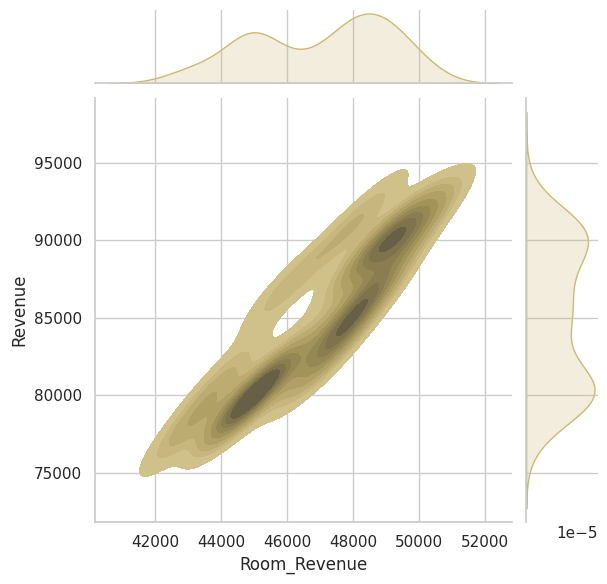

...

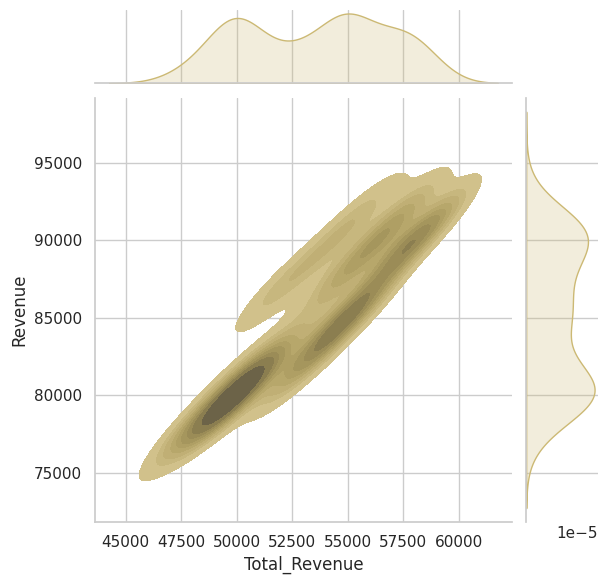

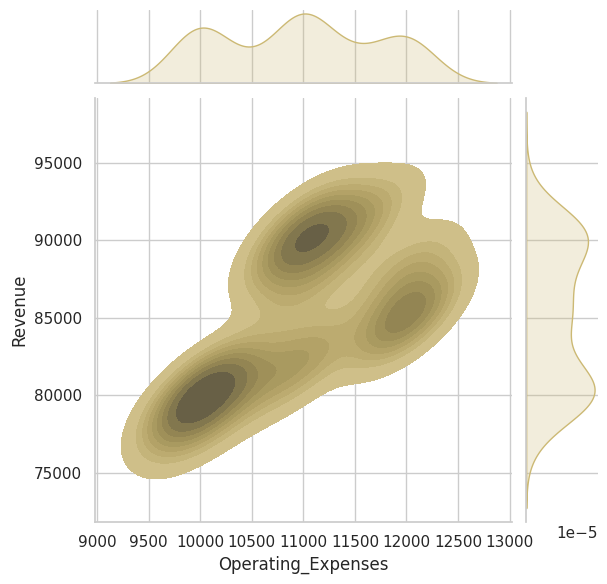

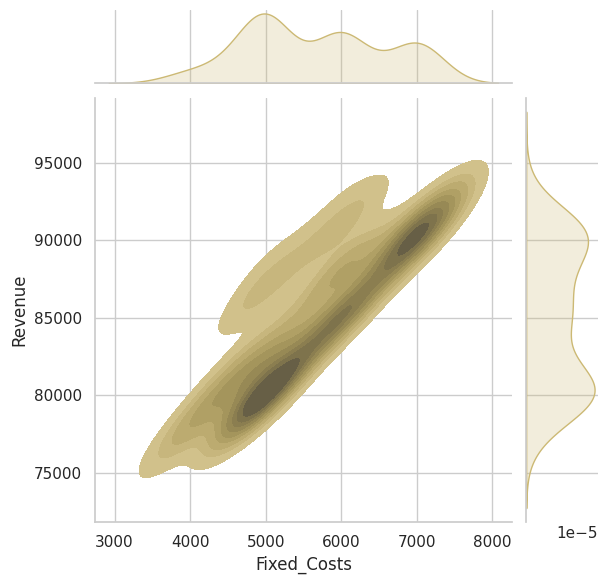

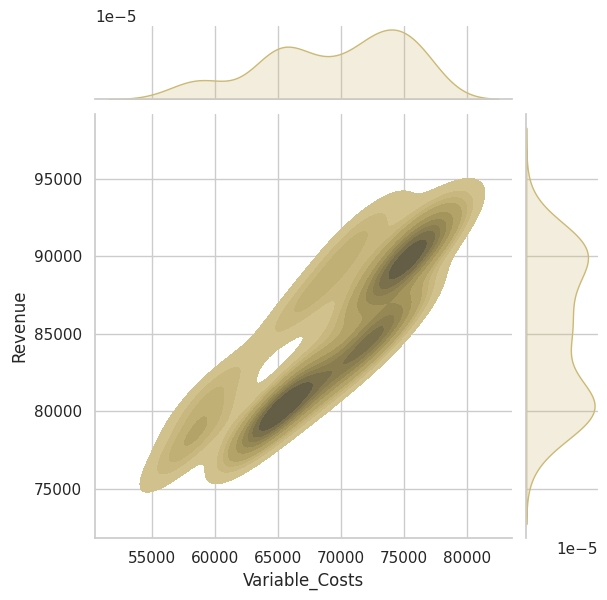

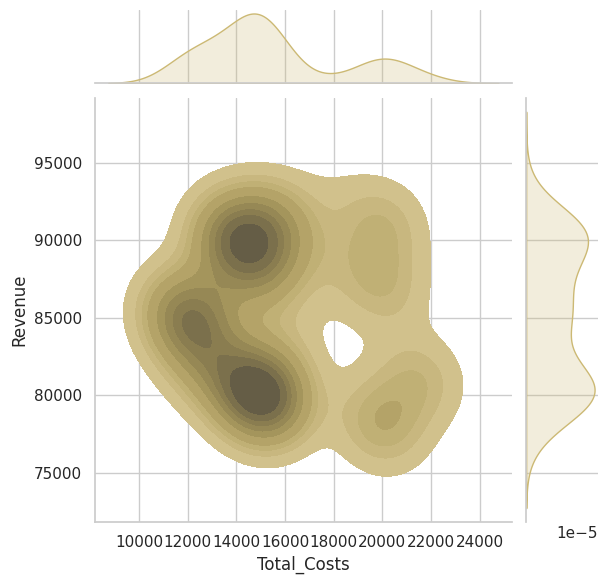

In [47]:
for col in data.select_dtypes("number"):
    if col !="Revenue":
       with sns.axes_style("white"):
           sns.set(style="whitegrid")  # Set the plot style
           sns.set_palette("coolwarm")    # Set the color palette
           sns.jointplot(x=data[col],y=data["Revenue"],kind="kde",fill=True,color="y")

In [48]:
!pip install pywaffle

In [49]:
! pip install waffle

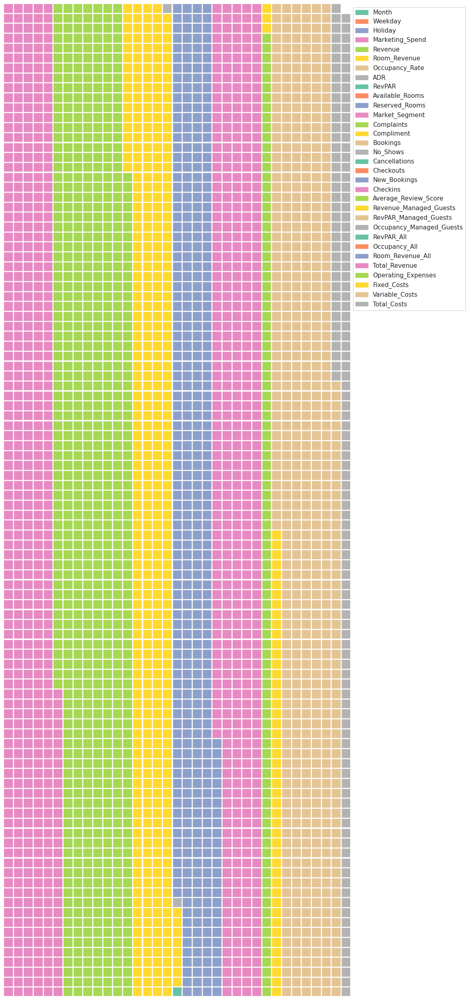

In [50]:
# Make a waffel for the Data:
import matplotlib.pyplot as plt
from pywaffle import Waffle

numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
values = data[numeric_columns].sum().tolist()

fig = plt.figure(
    FigureClass=Waffle,
    rows=100,
    columns=35,
    values=values,
    legend={'labels': numeric_columns.tolist(),
            'loc': "upper left",
            'bbox_to_anchor': (1, 1)},
    figsize=(25, 25)  # Set the figure size to 10 inches by 8 inches
)

plt.show()

## Explantory of the Dataset :

In [51]:
# VaraianceThreshold:
selector=VarianceThreshold(threshold=0.01)
selector.fit(data.select_dtypes("number"))

VarianceThreshold(threshold=0.01)

In [52]:
class Var_Selector(BaseEstimator,TransformerMixin):
    
    def __init__(self,num_cols):
        self.num_cols=None
    def fit(self,data):
        self.num_cols=data.select_dtypes("number").columns
        return self
    def transform(self,data):
        selector=VarianceThreshold(threshold=0.01)
        selector.fit(data[self.num_cols])
        
        removed_cols=[column for column in self.num_cols if column not in \
                     self.num_cols[selector.get_support(indices=True)]]
        data=data.drop(columns=removed_cols)
        
        # remove high-low cardinality categorical:-
        
        removed_cols=data.nunique()[((data.nunique()==1)|data.nunique()==len(data))].index
        
        return data.drop(columns=removed_cols)
        

In [53]:
transform=Var_Selector(data)
transform.fit(data)
transform.transform(data)

,Date,Month,Weekday,Season,Holiday,Marketing_Spend,Revenue,Room_Revenue,ADR,RevPAR,...,Revenue_Managed_Guests,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
0,01/01/2024,1,1,Winter,1,50000,80000,45000,120,90.00,...,800,4.5,75,4.5,45000,50000,10000,5000,65000,15000
1,02/01/2024,1,2,Winter,0,60000,85000,48000,125,97.50,...,850,4.6,78,4.6,48000,55000,12000,6000,73000,12000
2,03/01/2024,1,3,Winter,0,70000,90000,49000,130,104.00,...,900,4.7,80,4.7,49000,58000,11000,7000,76000,14000
3,04/01/2024,1,4,Winter,1,50000,80000,45000,120,90.00,...,800,4.5,75,4.5,45000,50000,10000,5000,65000,15000
4,05/01/2024,1,5,Winter,0,60000,85000,48000,125,97.50,...,850,4.6,78,4.6,48000,55000,12000,6000,73000,12000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,27/07/2024,7,5,Summer,0,50000,78000,43000,115,79.15,...,780,4.3,73,4.3,43000,48000,10000,4000,58000,20000
105,28/07/2024,7,6,Summer,0,55000,81000,44000,120,82.50,...,810,4.4,75,4.4,44000,50000,10500,4500,59500,21500
106,29/07/2024,7,7,Summer,0,65000,87000,46000,125,90.40,...,870,4.5,78,4.5,46000,52000,11000,5000,67000,20000
107,30/07/2024,7,1,Summer,0,70000,91000,48000,130,96.00,...,910,4.7,80,4.7,48000,55000,11000,6000,71000,20000


In [54]:
# Check if there are aduplicated values in the data:
df=data
duplicated_features=df.duplicated().sum()
print("Number of duplicates ----->>> ",duplicated_features)

Number of duplicates ----->>>  0


In [55]:
# Calculate the correlation & plot the heatmap-correlation Matrix:

corr=data.select_dtypes("number").corr()
corr

,Month,Weekday,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,ADR,RevPAR,Available_Rooms,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
Month,1.000000,-0.010121,-0.159064,0.012519,-0.040698,-0.346580,-0.186715,-0.174598,-0.449316,-0.230387,...,-0.361349,-0.186715,-0.361349,-0.186715,-0.346580,-0.304626,-0.146988,-0.403236,-0.441824,0.809524
Weekday,-0.010121,1.000000,0.058732,0.022283,0.033615,0.002421,0.019129,0.043428,0.010915,0.036955,...,0.014348,0.019129,0.014348,0.019129,0.002421,0.003702,0.000815,-0.004446,0.002104,0.050238
Holiday,-0.159064,0.058732,1.000000,-0.033041,-0.012172,0.053650,0.020303,0.034726,0.094887,0.021747,...,0.064464,0.020303,0.064464,0.020303,0.053650,0.027095,-0.019976,0.074775,0.067588,-0.153612
Marketing_Spend,0.012519,0.022283,-0.033041,1.000000,0.987278,0.873177,0.957134,0.935154,0.821076,0.915673,...,0.761228,0.957134,0.761228,0.957134,0.873177,0.908954,0.645148,0.854997,0.826253,-0.039153
Revenue,-0.040698,0.033615,-0.012172,0.987278,1.000000,0.906077,0.975667,0.971821,0.868154,0.945720,...,0.806344,0.975667,0.806344,0.975667,0.906077,0.919145,0.659484,0.878613,0.864604,-0.094547
Room_Revenue,-0.346580,0.002421,0.053650,0.873177,0.906077,1.000000,0.963800,0.936627,0.968040,0.935291,...,0.863772,0.963800,0.863772,0.963800,1.000000,0.963960,0.786264,0.928772,0.976208,-0.467685
Occupancy_Rate,-0.186715,0.019129,0.020303,0.957134,0.975667,0.963800,1.000000,0.977340,0.930100,0.973949,...,0.875886,1.000000,0.875886,1.000000,0.963800,0.957062,0.713744,0.920364,0.929955,-0.263412
ADR,-0.174598,0.043428,0.034726,0.935154,0.971821,0.936627,0.977340,1.000000,0.933811,0.951629,...,0.854619,0.977340,0.854619,0.977340,0.936627,0.923811,0.653986,0.916415,0.896640,-0.203629
RevPAR,-0.449316,0.010915,0.094887,0.821076,0.868154,0.968040,0.930100,0.933811,1.000000,0.903810,...,0.882702,0.930100,0.882702,0.930100,0.968040,0.935771,0.657131,0.955988,0.965536,-0.507920
Available_Rooms,-0.230387,0.036955,0.021747,0.915673,0.945720,0.935291,0.973949,0.951629,0.903810,1.000000,...,0.898210,0.973949,0.898210,0.973949,0.935291,0.947015,0.715487,0.906551,0.935176,-0.322227


In [56]:
# spearman correlation:

sperman=data.select_dtypes("number").corr(method="spearman")
sperman

,Month,Weekday,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,ADR,RevPAR,Available_Rooms,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
Month,1.000000,0.007046,-0.136516,0.021718,-0.005267,-0.258277,-0.119241,-0.113631,-0.305887,-0.136091,...,-0.249614,-0.119241,-0.249614,-0.119241,-0.258277,-0.262587,-0.109694,-0.341807,-0.327731,0.625392
Weekday,0.007046,1.000000,0.061814,0.019386,0.029024,0.007702,0.019348,0.037235,0.005128,0.039126,...,0.009702,0.019348,0.009702,0.019348,0.007702,0.002462,-0.000497,-0.007881,0.003271,0.038247
Holiday,-0.136516,0.061814,1.000000,-0.034312,-0.011824,0.057238,0.020201,0.017883,0.066817,0.009318,...,0.045126,0.020201,0.045126,0.020201,0.057238,0.029911,-0.015902,0.073503,0.049262,-0.099874
Marketing_Spend,0.021718,0.019386,-0.034312,1.000000,0.979795,0.888838,0.967061,0.957982,0.868620,0.955250,...,0.799947,0.967061,0.799947,0.967061,0.888838,0.911869,0.648295,0.852277,0.868657,-0.045691
Revenue,-0.005267,0.029024,-0.011824,0.979795,1.000000,0.912585,0.984268,0.984792,0.886075,0.969400,...,0.826341,0.984268,0.826341,0.984268,0.912585,0.905555,0.673490,0.862454,0.863947,-0.048405
Room_Revenue,-0.258277,0.007702,0.057238,0.888838,0.912585,1.000000,0.960968,0.957687,0.987702,0.925668,...,0.832192,0.960968,0.832192,0.960968,1.000000,0.954121,0.751701,0.950042,0.959744,-0.327886
Occupancy_Rate,-0.119241,0.019348,0.020201,0.967061,0.984268,0.960968,1.000000,0.993008,0.945181,0.979300,...,0.866428,1.000000,0.866428,1.000000,0.960968,0.945905,0.686988,0.928369,0.922147,-0.163315
ADR,-0.113631,0.037235,0.017883,0.957982,0.984792,0.957687,0.993008,1.000000,0.940622,0.984262,...,0.861108,0.993008,0.861108,0.993008,0.957687,0.944493,0.698903,0.916085,0.921131,-0.162249
RevPAR,-0.305887,0.005128,0.066817,0.868620,0.886075,0.987702,0.945181,0.940622,1.000000,0.920109,...,0.848825,0.945181,0.848825,0.945181,0.987702,0.962367,0.736571,0.960307,0.972273,-0.393934
Available_Rooms,-0.136091,0.039126,0.009318,0.955250,0.969400,0.925668,0.979300,0.984262,0.920109,1.000000,...,0.896819,0.979300,0.896819,0.979300,0.925668,0.957357,0.671047,0.922442,0.930911,-0.231416


In [57]:
# pearson :

pearson=data.select_dtypes("number").corr(method="pearson")
pearson

,Month,Weekday,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,ADR,RevPAR,Available_Rooms,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
Month,1.000000,-0.010121,-0.159064,0.012519,-0.040698,-0.346580,-0.186715,-0.174598,-0.449316,-0.230387,...,-0.361349,-0.186715,-0.361349,-0.186715,-0.346580,-0.304626,-0.146988,-0.403236,-0.441824,0.809524
Weekday,-0.010121,1.000000,0.058732,0.022283,0.033615,0.002421,0.019129,0.043428,0.010915,0.036955,...,0.014348,0.019129,0.014348,0.019129,0.002421,0.003702,0.000815,-0.004446,0.002104,0.050238
Holiday,-0.159064,0.058732,1.000000,-0.033041,-0.012172,0.053650,0.020303,0.034726,0.094887,0.021747,...,0.064464,0.020303,0.064464,0.020303,0.053650,0.027095,-0.019976,0.074775,0.067588,-0.153612
Marketing_Spend,0.012519,0.022283,-0.033041,1.000000,0.987278,0.873177,0.957134,0.935154,0.821076,0.915673,...,0.761228,0.957134,0.761228,0.957134,0.873177,0.908954,0.645148,0.854997,0.826253,-0.039153
Revenue,-0.040698,0.033615,-0.012172,0.987278,1.000000,0.906077,0.975667,0.971821,0.868154,0.945720,...,0.806344,0.975667,0.806344,0.975667,0.906077,0.919145,0.659484,0.878613,0.864604,-0.094547
Room_Revenue,-0.346580,0.002421,0.053650,0.873177,0.906077,1.000000,0.963800,0.936627,0.968040,0.935291,...,0.863772,0.963800,0.863772,0.963800,1.000000,0.963960,0.786264,0.928772,0.976208,-0.467685
Occupancy_Rate,-0.186715,0.019129,0.020303,0.957134,0.975667,0.963800,1.000000,0.977340,0.930100,0.973949,...,0.875886,1.000000,0.875886,1.000000,0.963800,0.957062,0.713744,0.920364,0.929955,-0.263412
ADR,-0.174598,0.043428,0.034726,0.935154,0.971821,0.936627,0.977340,1.000000,0.933811,0.951629,...,0.854619,0.977340,0.854619,0.977340,0.936627,0.923811,0.653986,0.916415,0.896640,-0.203629
RevPAR,-0.449316,0.010915,0.094887,0.821076,0.868154,0.968040,0.930100,0.933811,1.000000,0.903810,...,0.882702,0.930100,0.882702,0.930100,0.968040,0.935771,0.657131,0.955988,0.965536,-0.507920
Available_Rooms,-0.230387,0.036955,0.021747,0.915673,0.945720,0.935291,0.973949,0.951629,0.903810,1.000000,...,0.898210,0.973949,0.898210,0.973949,0.935291,0.947015,0.715487,0.906551,0.935176,-0.322227


In [58]:
# calculate kendall correaltion :

kendall=data.select_dtypes("number").corr(method="kendall")
kendall

,Month,Weekday,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,ADR,RevPAR,Available_Rooms,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
Month,1.000000,0.006122,-0.124908,0.018041,-0.004191,-0.204894,-0.095563,-0.089903,-0.238712,-0.112291,...,-0.209479,-0.095563,-0.209479,-0.095563,-0.204894,-0.214693,-0.095184,-0.287364,-0.262373,0.514260
Weekday,0.006122,1.000000,0.053965,0.017414,0.023603,0.006197,0.016100,0.029228,0.003110,0.032531,...,0.008124,0.016100,0.008124,0.016100,0.006197,0.002829,-0.000634,-0.006220,0.003348,0.029904
Holiday,-0.124908,0.053965,1.000000,-0.030979,-0.010242,0.050461,0.017881,0.015766,0.057704,0.008476,...,0.041446,0.017881,0.041446,0.017881,0.050461,0.026522,-0.014518,0.067570,0.042952,-0.087763
Marketing_Spend,0.018041,0.017414,-0.030979,1.000000,0.939084,0.783741,0.919336,0.904827,0.750220,0.909844,...,0.694952,0.919336,0.694952,0.919336,0.783741,0.821155,0.510861,0.759685,0.745533,-0.043960
Revenue,-0.004191,0.023603,-0.010242,0.939084,1.000000,0.809091,0.950341,0.951745,0.777311,0.915067,...,0.710148,0.950341,0.710148,0.950341,0.809091,0.786896,0.537153,0.755059,0.714011,-0.048290
Room_Revenue,-0.204894,0.006197,0.050461,0.783741,0.809091,1.000000,0.911065,0.898983,0.959355,0.862398,...,0.779967,0.911065,0.779967,0.911065,1.000000,0.892343,0.605764,0.899047,0.903637,-0.234865
Occupancy_Rate,-0.095563,0.016100,0.017881,0.919336,0.950341,0.911065,1.000000,0.976538,0.878362,0.945320,...,0.784518,1.000000,0.784518,1.000000,0.911065,0.866225,0.551988,0.867265,0.819711,-0.137613
ADR,-0.089903,0.029228,0.015766,0.904827,0.951745,0.898983,0.976538,1.000000,0.874376,0.953861,...,0.774764,0.976538,0.774764,0.976538,0.898983,0.858209,0.562682,0.847446,0.810420,-0.131818
RevPAR,-0.238712,0.003110,0.057704,0.750220,0.777311,0.959355,0.878362,0.874376,1.000000,0.839018,...,0.762888,0.878362,0.762888,0.878362,0.959355,0.882913,0.578799,0.899491,0.909487,-0.282030
Available_Rooms,-0.112291,0.032531,0.008476,0.909844,0.915067,0.862398,0.945320,0.953861,0.839018,1.000000,...,0.842153,0.945320,0.842153,0.945320,0.862398,0.911806,0.528470,0.876525,0.863294,-0.191853


(0.0, 11.2)

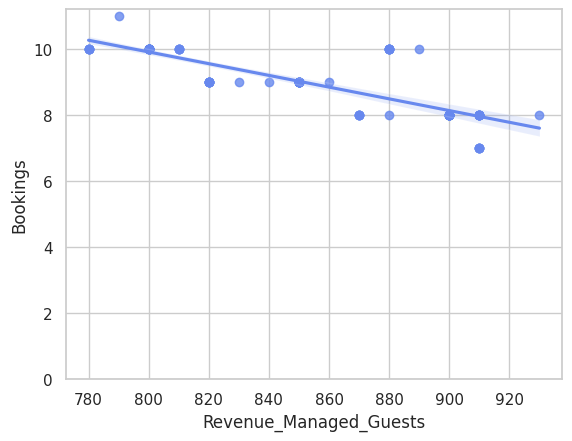

In [59]:
# Negative correlation Relationship :
sns.regplot(x=data["Revenue_Managed_Guests"],y=data["Bookings"])
plt.ylim(0,)

Text(0.5, 1.0, 'Correlation_HEatmap_MAtrix')

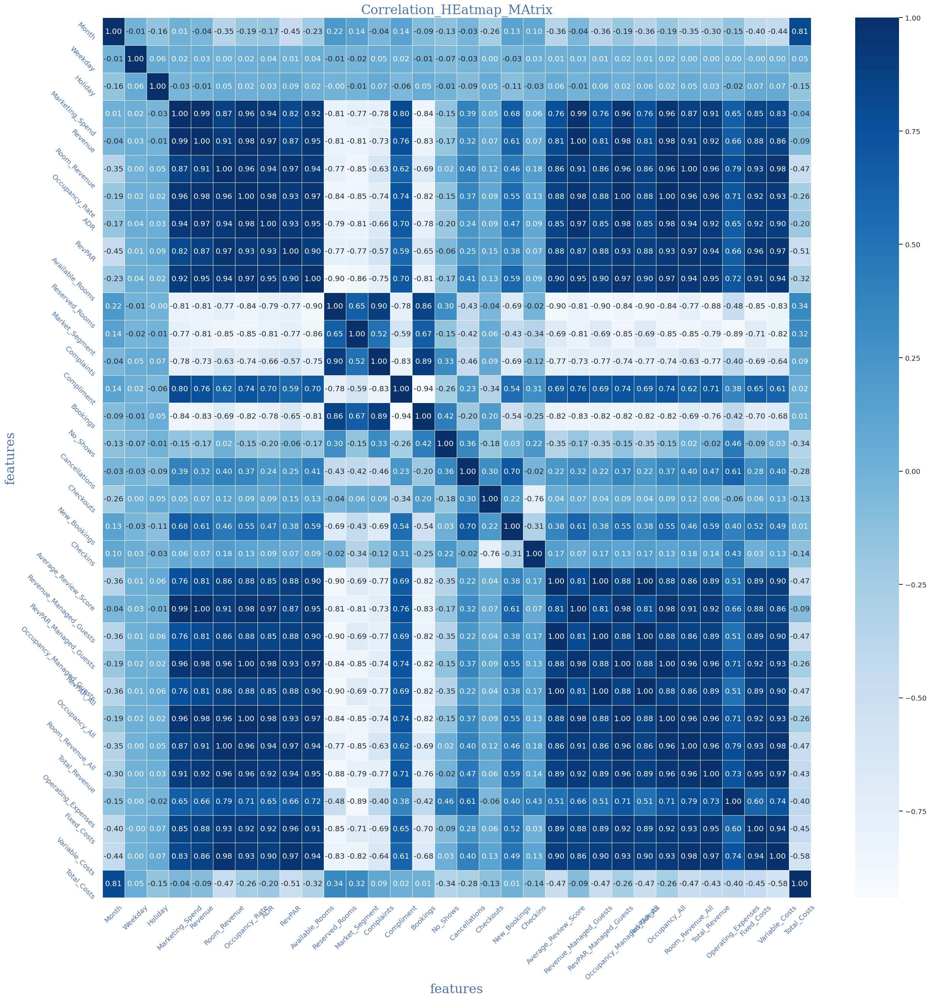

In [60]:
# plot the heatmap:
# 5-plot the heatmap_Correlation_MatRix:
f1={"family":"serif","size":20,"color":"b"}
plt.figure(figsize=(25,25),dpi=120)
sns.heatmap(data.select_dtypes("number").corr(),annot=True,fmt="0.2f",cmap='Blues',linewidths=0.5)
plt.xticks(rotation=45,color="b")
plt.yticks(rotation=-45,color="b")
plt.xlabel("features",fontdict=f1)
plt.ylabel("features",fontdict=f1)
plt.title("Correlation_HEatmap_MAtrix",fontdict=f1)


In [61]:
# ANOVA :
# Extract the most important Numerical Features:

fs=SelectKBest(score_func=f_classif,k=15)
fs.fit(data.drop(columns="Revenue").select_dtypes("number").fillna(0),data["Revenue"])

/opt/conda/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw


SelectKBest(k=15)

In [62]:
featurs_values=pd.DataFrame(fs.pvalues_)
features_scores=pd.DataFrame(fs.scores_)
features=pd.DataFrame(data.drop(columns="Revenue").select_dtypes("number").fillna(0).columns)


In [63]:
feature_score=pd.concat([featurs_values,features_scores,features],axis=1)
feature_score.columns=["pvalues","score","input"]
feature_score

,pvalues,score,input
0,4.679843e-20,17.108486,Month
1,8.684042e-01,0.587910,Weekday
2,9.931619e-01,0.297160,Holiday
3,2.477998e-111,2164.807152,Marketing_Spend
4,5.510053e-65,216.729863,Room_Revenue
5,5.029125e-100,1240.831484,Occupancy_Rate
6,6.844951e-71,291.993018,ADR
7,7.070028e-46,80.364824,RevPAR
8,6.923933e-107,1739.598390,Available_Rooms
9,2.048228e-71,299.782772,Reserved_Rooms


In [64]:
# Extract the most important Categorical Features :
from sklearn.feature_selection import mutual_info_classif

mic=SelectKBest(score_func=mutual_info_classif,k=5)
mic.fit(data.drop(columns="Revenue").select_dtypes("number").fillna(0),data["Revenue"])

features_MI_scores=pd.Series(mic.scores_,index=data.drop(columns="Revenue").select_dtypes("number").fillna(0).columns)
features_MI_scores.sort_values(ascending=True)

Weekday                     0.000000
Holiday                     0.000000
No_Shows                    0.915579
Checkins                    0.980129
Month                       1.017641
Cancellations               1.022136
Complaints                  1.179982
Bookings                    1.258399
New_Bookings                1.259637
Checkouts                   1.436027
Compliment                  1.442194
Reserved_Rooms              1.470615
Operating_Expenses          1.493251
Fixed_Costs                 1.521745
Average_Review_Score        1.650809
RevPAR_Managed_Guests       1.655273
RevPAR_All                  1.699232
Available_Rooms             1.798336
Room_Revenue                1.821473
Market_Segment              1.854055
Marketing_Spend             1.868852
ADR                         1.929873
Total_Revenue               1.937791
Occupancy_Managed_Guests    1.951191
Variable_Costs              1.953721
Room_Revenue_All            2.006613
Occupancy_Rate              2.006793
O

In [65]:
# Handle the outliers on the ALL features:
#calc Q1,Q2,Q3,IQR and detect the outliers:
#calc the lower & upper limits :

features=data.select_dtypes("number").columns
for col in features:
    Q1_col,Q3_col=data[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr 
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in data[col]: 
         if ((x> upper_limit) or (x<low_limit)): 
             outlier.append(x)           
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")
       
    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)}")
    print("-"*25)

 * -- >> there No outlier in Month feature
Q1 of Month --->>> 1.0 
 Q3 of Month ---->>> 7.0 
 iqr--->>6.0
 low_limit--->>>-8.0 
  upper_limit--->>> 16.0 
 outlier---->>> [] 
 Number of outliers --->>> 0
-------------------------
 * -- >> there No outlier in Weekday feature
Q1 of Weekday --->>> 2.0 
 Q3 of Weekday ---->>> 6.0 
 iqr--->>4.0
 low_limit--->>>-4.0 
  upper_limit--->>> 12.0 
 outlier---->>> [] 
 Number of outliers --->>> 0
-------------------------
Ther outlier in this feature Holiday
Q1 of Holiday --->>> 0.0 
 Q3 of Holiday ---->>> 0.0 
 iqr--->>0.0
 low_limit--->>>0.0 
  upper_limit--->>> 0.0 
 outlier---->>> [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1] 
 Number of outliers --->>> 13
-------------------------
 * -- >> there No outlier in Marketing_Spend feature
Q1 of Marketing_Spend --->>> 50000.0 
 Q3 of Marketing_Spend ---->>> 70000.0 
 iqr--->>20000.0
 low_limit--->>>20000.0 
  upper_limit--->>> 100000.0 
 outlier---->>> [] 
 Number of outliers --->>> 0
---------------------

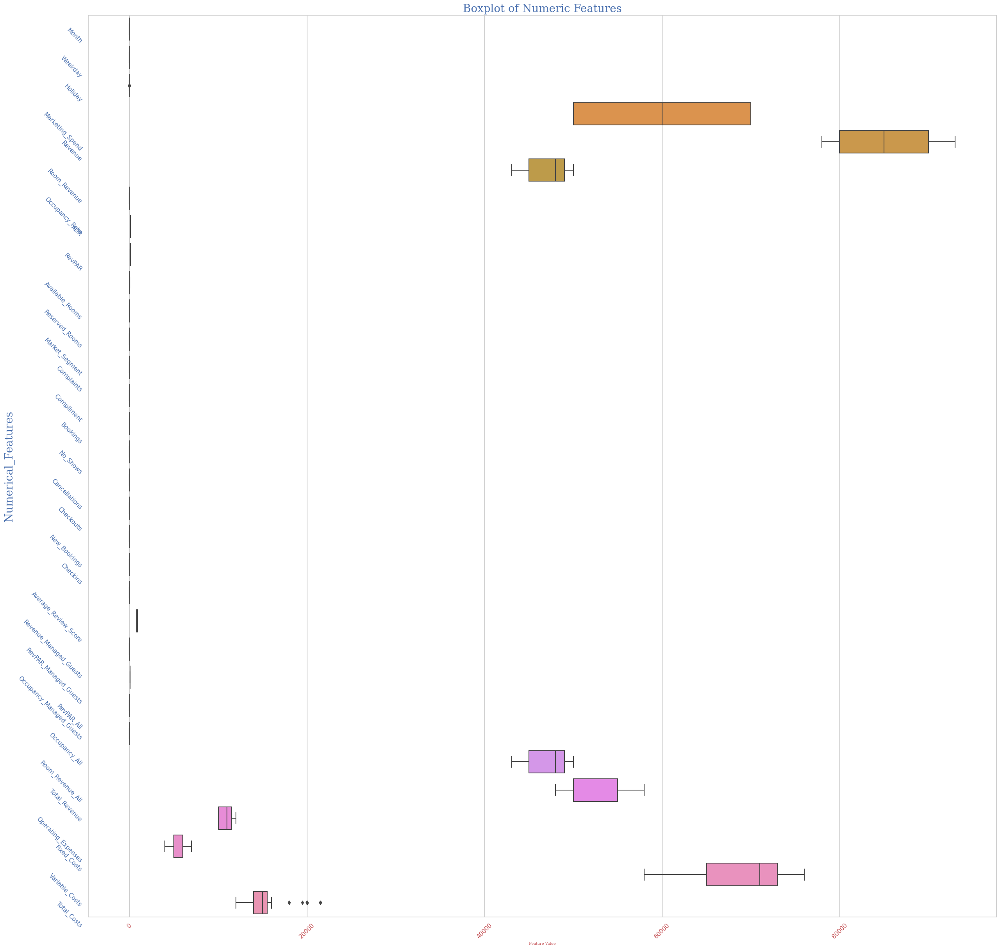

In [66]:
# Check the outliers : from plot found that there are outlier in Holiday ,Total_costs:
plt.figure(figsize=(30, 30))
sns.boxplot(data=data.select_dtypes("number"), orient='h')
plt.title('Boxplot of Numeric Features',fontdict=f1)
plt.xlabel('Feature Value',fontdict=f)
plt.xticks(rotation=45,color="r")
plt.yticks(rotation=-45,color="b")
plt.ylabel("Numerical_Features",fontdict=f1)
plt.show()

upper_limit :  23806.72936155298
lower_limit :  7119.876143034173
Mean Value :  15463.302752293577
Median Value :  15000.0
1st Standard Deviation :  2781.142203086468


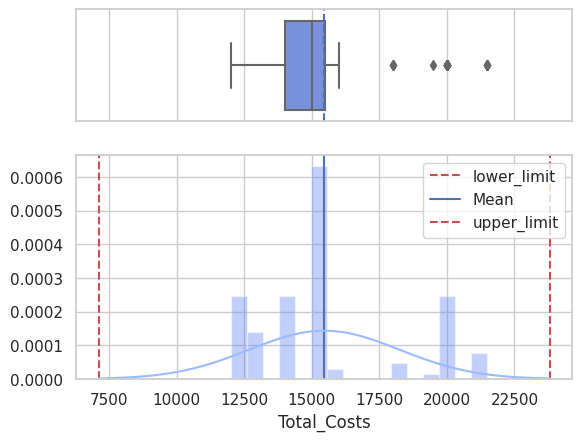

In [67]:
#calculate the outlier ,upper,lowwer limits ,mean_value,median_vale,standard_devation:
from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.Total_Costs.mean()
std = data.Total_Costs.std()
median = data.Total_Costs.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["Total_Costs"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["Total_Costs"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

upper_limit :  1.0960610388408196
lower_limit :  -0.8575289287490764
Mean Value :  0.11926605504587157
Median Value :  0.0
1st Standard Deviation :  0.32559832793164933


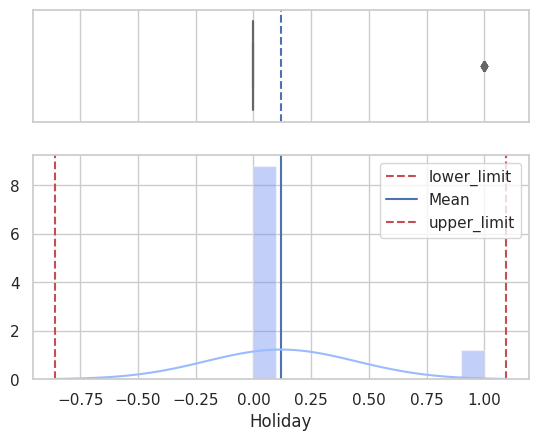

In [68]:
#calculate the outlier ,upper,lowwer limits ,mean_value,median_vale,standard_devation:
from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.Holiday.mean()
std = data.Holiday.std()
median = data.Holiday.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["Holiday"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["Holiday"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

## Data processing and Training :

In [69]:
# Convert all Categorical columns into Numerical columns :
label_encoder=LabelEncoder()
for col in data.columns:
    data[col]=label_encoder.fit_transform(data[col])
data    

,Date,Month,Weekday,Season,Holiday,Marketing_Spend,Revenue,Room_Revenue,Occupancy_Rate,ADR,...,RevPAR_Managed_Guests,Occupancy_Managed_Guests,RevPAR_All,Occupancy_All,Room_Revenue_All,Total_Revenue,Operating_Expenses,Fixed_Costs,Variable_Costs,Total_Costs
0,0,0,0,2,1,0,2,2,2,2,...,2,2,2,2,2,2,0,2,2,3
1,3,0,1,2,0,2,7,5,5,7,...,3,5,3,5,5,6,4,3,8,0
2,7,0,2,2,0,4,12,6,7,9,...,4,7,4,7,6,8,2,4,11,2
3,11,0,3,2,1,0,2,2,2,2,...,2,2,2,2,2,2,0,2,2,3
4,15,0,4,2,0,2,7,5,5,7,...,3,5,3,5,5,6,4,3,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,98,3,4,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,8
105,101,3,5,1,0,1,3,1,2,2,...,1,2,1,2,1,2,1,1,1,9
106,104,3,6,1,0,3,9,3,5,7,...,2,5,2,5,3,3,2,2,3,8
107,106,3,0,1,0,4,13,5,7,9,...,4,7,4,7,5,6,2,3,7,8


In [70]:
# split the data into Target & the other data:

x=data.drop(columns="Operating_Expenses",axis=1)
y=data["Operating_Expenses"]

print(np.shape(x),np.shape(y))

(109, 36) (109,)


In [71]:
# train the data:

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,stratify=y,random_state=42)
print(np.shape(x_train),np.shape(x_test))
print(np.shape(y_train),np.shape(y_test))


(76, 36) (33, 36)
(76,) (33,)


## Bulding the models :

In [72]:
# Dictionary of models

models_dict = {
    "RC": RandomForestRegressor(),
    "LR": LinearRegression(),
    "RT": DecisionTreeRegressor(),
    "SVM": SVR(kernel="linear"),
}

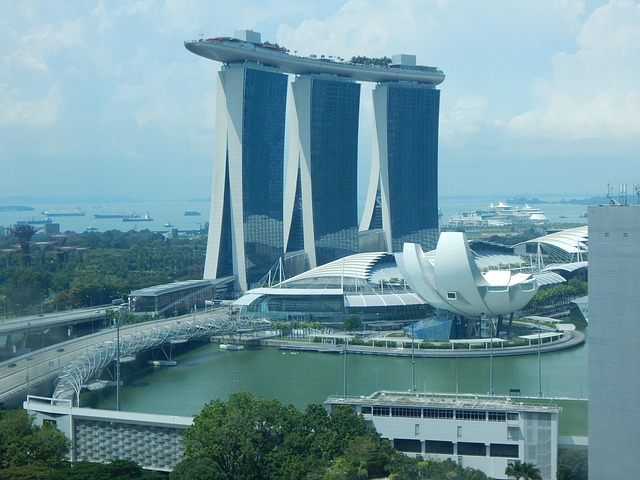

In [73]:
from io import BytesIO
from PIL import Image
import requests
from IPython.display import display

# URL of the image you want to display
url = 'https://cdn.pixabay.com/photo/2016/05/06/12/55/singapore-1375832_640.jpg'
# Fetch the image data from the URL
response = requests.get(url)
img = Image.open(BytesIO(response.content))

# Display the image
display(img)

In [74]:
for model_name, model in models_dict.items():
    # Fit the model to the training data
    
    model.fit(x_train, y_train)
    
    # Make predictions on the test data
    
    y_pred = model.predict(x_test)
    
    # Evaluate the model
    
    mse = metrics.mean_squared_error(y_test, y_pred)
    acc = model.score(x_test,y_test)
    
    print("*"*50)

    # Print the evaluation metrics for each model
    
    print(f"Model: {model_name}")
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"model_accuracy: {acc*100:0.2f}%")
    print("-"*50)

**************************************************
Model: RC
Mean Squared Error (MSE): 0.1559969696969697
model_accuracy: 92.95%
--------------------------------------------------
**************************************************
Model: LR
Mean Squared Error (MSE): 0.07002346115678883
model_accuracy: 96.83%
--------------------------------------------------
**************************************************
Model: RT
Mean Squared Error (MSE): 0.18181818181818182
model_accuracy: 91.78%
--------------------------------------------------
**************************************************
Model: SVM
Mean Squared Error (MSE): 0.07879874455585027
model_accuracy: 96.44%
--------------------------------------------------


## And that was the Results :
   
   * Model: RandomForestRegressor
   
   * Mean Squared Error (MSE): 0.12617272727272727
   
   * model_accuracy: 94.29%
--------------------------------------------------
   * Model: LinearRegression
   
   * Mean Squared Error (MSE): 0.07002346115678748 
   
   * model_accuracy: 96.83%
--------------------------------------------------

   * Model: DecisionTreeRegressor
   
   * Mean Squared Error (MSE): 0.15151515151515152
   
   * model_accuracy: 93.15%
--------------------------------------------------

  * Model: Support Vector Regressor 
  
  * Mean Squared Error (MSE): 0.07879874455585027
  
  * model_accuracy: 96.44%
--------------------------------------------------

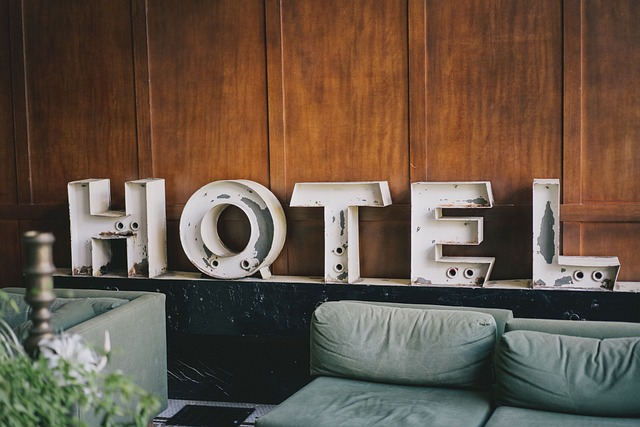

In [75]:
from io import BytesIO
from PIL import Image
import requests
from IPython.display import display

# URL of the image you want to display
url = 'https://cdn.pixabay.com/photo/2017/08/02/18/14/architecture-2572715_640.jpg'
# Fetch the image data from the URL
response = requests.get(url)
img = Image.open(BytesIO(response.content))

# Display the image
display(img)


  - Here is End of my project .
  
  - Devloper : AbdalRahman Gameel Hebishy 

  - if you see that my Notebook Content is usefull , visit my works page 
  
  - Kaggle :https://www.kaggle.com/abdalrhamnhebishy
  